## Modelización

### Librerías

Librerías y funciones que se importan en este estudio:

  1. `import pandas as pd`:
    - `pandas` es una poderosa biblioteca de Python utilizada para la manipulación y análisis de datos.
    - `pd` es un alias comúnmente utilizado para referirse a la biblioteca `pandas`.

  2. `import numpy as npy`:
    - `numpy` es una librería fundamental para la computación numérica en Python, que proporciona soporte para arreglos y operaciones matriciales.
    - `npy` es un alias comúnmente utilizado para referirse a la biblioteca `numpy`.

  3. `import matplotlib.pyplot as plt`:
    - `matplotlib` es una biblioteca ampliamente utilizada para la creación de gráficos y visualización de datos en Python.
    - `pyplot` es un módulo dentro de `matplotlib` que proporciona una interfaz similar a la de MATLAB para crear gráficos.
    - `plt` es un alias comúnmente utilizado para referirse al módulo `pyplot`.

  4. `from matplotlib import dates`:
    - `matplotlib.dates` es un módulo de `matplotlib` que se utiliza para trabajar con fechas y horas en gráficos, como la formateación de ejes de tiempo.

  5. `import seaborn as sns`:
    - `seaborn` es una biblioteca de visualización de datos que se basa en `matplotlib` y simplifica la creación de gráficos estadísticos atractivos y informativos en Python.

  6. `from datetime import datetime`:
    - `datetime` es un módulo de Python que proporciona clases y funciones para trabajar con fechas y horas.

  7. `import pycaret`:
    - `pycaret` es una biblioteca de Python que simplifica y automatiza el proceso de construcción, ajuste y evaluación de modelos de aprendizaje automático. Es útil para tareas de clasificación y regresión.

  8. `from pycaret.classification import ClassificationExperiment`:
    - `ClassificationExperiment` es una clase específica dentro del módulo de clasificación de `pycaret` que se utiliza para configurar y gestionar experimentos de clasificación.

Estas librerías y funciones son fundamentales para tareas como la manipulación de datos, la visualización de gráficos, la construcción de modelos de aprendizaje automático y la creación de interfaces interactivas en Python.

In [32]:
import pandas as pd
import numpy as npy
import matplotlib.pyplot as plt
from matplotlib import dates
import seaborn as sns

from datetime import datetime

from sklearn.model_selection import train_test_split

import pycaret
from pycaret.classification import *
from pycaret.classification import ClassificationExperiment
from pycaret.classification import dashboard

En este reto se pide estudiar las condiciones del tráfico, con información recopilada gracias a un sistema de visión. El sistema detecta cuatro clases de vehículos a la entrada de un polígono industrial al que acceden trabajadores a diario:

  * Automóviles (vehículos utilitarios)
  * Bicicletas
  * Autobuses
  * Camiones

El conjunto de datos se almacena en un archivo CSV e incluye columnas que dan información adicional, y que puede ser necesaria para el modelo que desarrolles:

  * Horas (con información actualizada en bloques de 15 minutos)
  * Fecha (el número del día del mes, ya que el estudio está hecho en un mes completo de 31 días)
  * Días de la semana (de lunes a domingo)
  * Recuentos para cada tipo de vehículo (`CarCount`, `BikeCount`, `BusCount`, `TruckCount`).
  * La columna `Total` representa el recuento total de todos los tipos de vehículos detectados en un período de 15 minutos.
  
El conjunto de datos se actualiza cada 15 minutos, lo que proporciona una visión completa de los patrones de tráfico a lo largo de un mes completo (31 días). Además, el conjunto de datos incluye una columna que indica la situación del tráfico categorizada en cuatro clases:

  * **Heavy**: tráfico denso y con propensión a atascos
  * **High**: alto, con altas probabilidades de atascos
  * **Normal**: tráfico normal, sin incidencias reseñables
  * **Low**: bajo, con muy baja probabilidad de incidencias.
  
Esta información te debe ayudar a evaluar la gravedad de la congestión y a monitorizar las condiciones del tráfico en diferentes momentos y días de la semana.

Contarás con dos bases de datos para elaborar un modelo de clasificación basado en datos etiquetados:

  * **train_datos trafico.csv**: Esta base de datos completa y clasificada, con 2380 registros, te permitirá entrenar tu modelo. Comienza realizando un análisis descriptivo de la información, identifica las variables que son realmente significativas en tu análisis y entrena tu modelo.

[train_datos trafico](https://kopuru.com/wp-content/uploads/2023/11/train_datos-trafico.csv)

  * **test_datos trafico.csv**: Te proporcionamos además la base de datos de test, la cual, una vez tengas tu algoritmo listo, deberás utilizar para obtener los resultados de 596 registros, a los que tu modelo asignará la clasificación de la tipología de tráfico para cada registro.

[test_datos trafico](https://kopuru.com/wp-content/uploads/2023/11/test_datos-trafico.csv)

### Datos

In [33]:
train = pd.read_csv('../data/train_datos-trafico.csv',)
test = pd.read_csv('../data/test_datos-trafico.csv',)

In [34]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2380 entries, 0 to 2379
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Time               2380 non-null   object
 1   Date               2380 non-null   int64 
 2   Day of the week    2380 non-null   object
 3   CarCount           2380 non-null   int64 
 4   BikeCount          2380 non-null   int64 
 5   BusCount           2380 non-null   int64 
 6   TruckCount         2380 non-null   int64 
 7   Total              2380 non-null   int64 
 8   Traffic Situation  2380 non-null   object
dtypes: int64(6), object(3)
memory usage: 167.5+ KB


In [35]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 596 entries, 0 to 595
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Time             596 non-null    object
 1   Date             596 non-null    int64 
 2   Day of the week  596 non-null    object
 3   CarCount         596 non-null    int64 
 4   BikeCount        596 non-null    int64 
 5   BusCount         596 non-null    int64 
 6   TruckCount       596 non-null    int64 
 7   Total            596 non-null    int64 
dtypes: int64(6), object(2)
memory usage: 37.4+ KB


El conjunto de datos de `train` consta de 2380 registros y el conjunto de datos de `test` consta de 596. Vamos a relaizar las transformaciones y creación de variables que consideremos oportunas y vamos a separar el conjunto de datos de `train` en dos subconjuntos en una proporción del 80%/20% que usaremos para entrenar y validar, ya que de este 20% de muestras sí tendremos la situación del tráfico real.

Categorizamos las variables `Day of the week` y `Traffic Situation` en el conjunto de datos de entrenamiento y de la misma manera, categorizamos la variable `Day of the week` en el conjunto de datos de validación.

In [36]:
train['Day of the week'] = \
    pd.Categorical(train['Day of the week'], 
                   categories = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
test['Day of the week'] = \
    pd.Categorical(test['Day of the week'], 
                   categories = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

train['Traffic Situation'] = \
    pd.Categorical(train['Traffic Situation'],
                   categories = ['low', 'normal', 'high', 'heavy'])

In [37]:
# https://www.disfrutalasmatematicas.com/medida/hora-convertir.html
# https://es.linkedin.com/pulse/de-am-pm-24hrs-con-python-luis-felipe-castro-calder%C3%B3n

def change_am_pm_24(x, in_pattern = '%I:%M:%S %p', out_pattern = '%H:%M:%S'):
    
    """
    Convierte una cadena de tiempo en formato AM/PM a formato de 24 horas.

    Parámetros:
    ===========
    x (str)           : Cadena de tiempo en formato AM/PM.
    in_pattern (str)  : Formato de entrada de la cadena de tiempo (por defecto, '%I:%M:%S %p').
    out_pattern (str) : Formato de salida de la cadena de tiempo (por defecto, '%H:%M:%S').

    Retorna:
    ========
    datetime          : Objeto de datetime con la cadena de tiempo convertida a formato de 24 horas.
    """
    
    in_time = datetime.strptime(x, in_pattern)
    out_time = datetime.strftime(in_time, out_pattern)

    return pd.to_datetime(out_time, format = "%H:%M:%S")


In [38]:
train.Time = list(map(change_am_pm_24, train.Time))
train['Hour'] = [str(x)[11:16] for x in train.Time]

test.Time = list(map(change_am_pm_24, test.Time))
test['Hour'] = [str(x)[11:16] for x in test.Time]

In [39]:
train = train[['Hour', 'Day of the week', 'CarCount', 'BikeCount', 'BusCount', 'TruckCount', 'Total', 'Traffic Situation']]
train.head(15)

,Hour,Day of the week,CarCount,BikeCount,BusCount,TruckCount,Total,Traffic Situation
0,05:15,Thursday,64,27,5,5,101,low
1,07:15,Sunday,150,13,31,4,198,heavy
2,07:00,Tuesday,134,10,44,0,188,heavy
3,05:45,Sunday,108,24,2,19,153,normal
4,20:15,Tuesday,80,14,20,15,129,normal
5,01:45,Wednesday,20,1,1,10,32,low
6,07:15,Monday,127,38,48,0,213,heavy
7,09:30,Sunday,64,12,27,8,111,normal
8,22:15,Tuesday,14,2,0,35,51,normal
9,23:15,Sunday,11,1,1,19,32,normal


In [40]:
test = test[['Hour', 'Day of the week', 'CarCount', 'BikeCount', 'BusCount', 'TruckCount', 'Total', ]]
test.head(15)

,Hour,Day of the week,CarCount,BikeCount,BusCount,TruckCount,Total
0,01:00,Saturday,15,5,0,10,30
1,20:30,Wednesday,86,15,15,23,139
2,21:45,Tuesday,102,5,19,11,137
3,06:45,Sunday,109,14,38,1,162
4,00:15,Sunday,14,2,1,26,43
5,21:00,Saturday,63,18,11,5,97
6,03:15,Tuesday,12,4,1,28,45
7,14:30,Saturday,62,28,18,20,128
8,01:00,Wednesday,12,2,1,17,32
9,03:30,Friday,18,4,0,30,52


Vamos a crear tres variables: `CarRate`, `TruckRate` y `BusRate` que nos darán información sobre el porcentaje de cada tipo de vehículo que entra al polígono industrial cada 15 minutos. La idea es clara, no es lo mismo que entre 100 bicicletas en 15 minutos que entren 90 coches y 10 camiones en 15 minutos y auqnue esta información ya la tenemos en el dataset puede que con el total y el porcentaje de coches sea suficiente para crear un modelo robusto. En cualquier caso, el análisis de las características y su importancia nos indicará el interés de estas variables.

In [41]:
train = pd.get_dummies(train, columns = ['Day of the week'], prefix = '', prefix_sep = '')
train['CarRate'] = 100 * train['CarCount'] / train['Total']
train['TruckRate'] = 100 * train['TruckCount'] / train['Total']
train['BusRate'] = 100 * train['BusCount'] / train['Total']

test = pd.get_dummies(test, columns = ['Day of the week'], prefix = '', prefix_sep = '')
test['CarRate'] = 100 * test['CarCount'] / train['Total']
test['TruckRate'] = 100 * test['TruckCount'] / train['Total']
test['BusRate'] = 100 * test['BusCount'] / train['Total']

In [42]:
train.head()

,Hour,CarCount,BikeCount,BusCount,TruckCount,Total,Traffic Situation,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,CarRate,TruckRate,BusRate
0,05:15,64,27,5,5,101,low,0,0,0,1,0,0,0,63.366337,4.950495,4.950495
1,07:15,150,13,31,4,198,heavy,0,0,0,0,0,0,1,75.757576,2.020202,15.656566
2,07:00,134,10,44,0,188,heavy,0,1,0,0,0,0,0,71.276596,0.000000,23.404255
3,05:45,108,24,2,19,153,normal,0,0,0,0,0,0,1,70.588235,12.418301,1.307190
4,20:15,80,14,20,15,129,normal,0,1,0,0,0,0,0,62.015504,11.627907,15.503876


In [43]:
test.head()

,Hour,CarCount,BikeCount,BusCount,TruckCount,Total,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,CarRate,TruckRate,BusRate
0,01:00,15,5,0,10,30,0,0,0,0,0,1,0,14.851485,9.900990,0.000000
1,20:30,86,15,15,23,139,0,0,1,0,0,0,0,43.434343,11.616162,7.575758
2,21:45,102,5,19,11,137,0,1,0,0,0,0,0,54.255319,5.851064,10.106383
3,06:45,109,14,38,1,162,0,0,0,0,0,0,1,71.241830,0.653595,24.836601
4,00:15,14,2,1,26,43,0,0,0,0,0,0,1,10.852713,20.155039,0.775194


### Modelización

En el contexto actual de una sociedad cada vez más interconectada y dependiente del transporte, la gestión eficiente del tráfico en áreas industriales y comerciales se ha convertido en un factor crítico para garantizar la fluidez de las operaciones y la seguridad de quienes transitan por esas zonas. En particular, los polígonos industriales representan nodos vitales de actividad económica y logística, donde el flujo vehicular puede variar significativamente a lo largo del día.

Este estudio tiene como objetivo principal desarrollar un modelo de pronóstico para la situación del tráfico a la entrada de un polígono industrial. La situación del tráfico se definirá en función de múltiples factores, incluyendo el número de coches, camiones, autobuses y bicicletas que ingresan al polígono industrial en intervalos de 15 minutos. La creación de un modelo preciso de pronóstico permitirá a las autoridades del polígono y a las empresas que operan en él tomar decisiones informadas y proactivas para gestionar el flujo vehicular, mejorar la seguridad vial y optimizar la logística.

Para lograr este objetivo, utilizaremos la librería PyCaret, una herramienta de aprendizaje automático de código abierto que simplifica significativamente el proceso de desarrollo de modelos. PyCaret proporciona una amplia gama de algoritmos de aprendizaje automático preconfigurados, así como herramientas para la selección de características, ajuste de hiperparámetros y evaluación de modelos. Esto permitirá un enfoque más eficiente en la construcción y evaluación de modelos, ahorrando tiempo y recursos valiosos.

A lo largo de este estudio, estudiaremos datos históricos de tráfico a la entrada del polígono industrial y emplearemos técnicas avanzadas de procesamiento de datos y aprendizaje automático para desarrollar un modelo que pueda predecir la situación del tráfico con precisión. Además, evaluaremos la robustez del modelo a través de pruebas y validación cruzada para garantizar su capacidad de generalización. Los resultados de este estudio no solo beneficiarán la gestión del tráfico en el polígono industrial en cuestión, sino que también servirán como un ejemplo de cómo el aprendizaje automático puede aplicarse eficazmente en la solución de problemas de logística y movilidad urbana en entornos industriales.

In [44]:
import yaml

with open('experiments.yaml') as f:
    EXPERIMENTS_ = yaml.safe_load(f)
    
EXPERIMENTS_['experiments'].keys()

dict_keys(['kopuru_challenge_traffic'])

A diferencia del proceso de los problemas de clasificación binaria, no tiene que elegir un umbral de puntuación para realizar predicciones. La respuesta predicha es la clase (por ejemplo, etiqueta) con la puntuación máxima predicha. En algunos casos, es posible que desee utilizar la respuesta predicha solo si se predice con una puntuación elevada. En este caso, puede elegir un umbral en las puntuaciones predichas en función de si aceptará la respuesta predicha o no.

Las métricas típicas que se utilizan en la multiclase son las mismas que se utilizan en el caso de la clasificación binaria. La métrica se calcula para cada clase al procesarla como un problema de clasificación binaria después de agrupar todas las otras clases como pertenecientes a la segunda clase. A continuación, se calcula el promedio de la métrica entre todas las clases para obtener una métrica de promedio macro (procesar cada clase como igual) o de media ponderada (ponderada por frecuencia de clase). En Amazon ML, la medición F1 de media se utiliza para evaluar el éxito predictivo de un clasificador multiclase.

El F1-Score es una métrica útil en problemas de multiclasificación por varias razones:

1. **Equilibrio entre Precisión y Recall**: El F1-Score combina la precisión y el recall en una sola métrica. En problemas de multiclasificación, es importante tener en cuenta tanto la capacidad del modelo para predecir correctamente cada clase (precisión) como su capacidad para identificar todas las instancias de cada clase (recall). El F1-Score encuentra un equilibrio entre estas dos medidas y proporciona una evaluación general del rendimiento del modelo en todas las clases.

2. **Sensibilidad a clases desequilibradas**: En problemas de multiclasificación, es común que las clases no estén equilibradas en términos de tamaño. Algunas clases pueden tener muchas más instancias que otras. En este contexto, utilizar solo la precisión puede ser engañoso, ya que un modelo podría ser altamente preciso en la clase mayoritaria pero pobre en la clase minoritaria. El F1-Score considera el recall, lo que significa que penaliza el rendimiento deficiente en las clases minoritarias.

3. **Evaluación global del rendimiento**: El F1-Score proporciona una evaluación global del rendimiento del modelo en todas las clases en lugar de centrarse en una clase específica. Esto es importante cuando se desea obtener una medida general de cuán bien el modelo está funcionando en el problema de clasificación en su conjunto.

4. **Interpretación intuitiva**: El F1-Score tiene una interpretación intuitiva y fácil de entender. Valores más altos indican un mejor rendimiento general del modelo, mientras que valores más bajos señalan un rendimiento deficiente.

En resumen, el F1-Score es una métrica valiosa en problemas de multiclasificación debido a su capacidad para equilibrar precisión y recall, su sensibilidad a clases desequilibradas y su capacidad para proporcionar una evaluación general del rendimiento del modelo en todas las clases. Esto lo convierte en una herramienta útil para evaluar la calidad de un modelo en problemas que involucran múltiples clases.

In [45]:
X = train.drop(columns = ['Traffic Situation'])
y = train['Traffic Situation']

In [46]:
X_train, X_validation, y_train, y_validation = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [47]:
train = pd.concat([X_train, y_train], axis = 1)
validation = pd.concat([X_validation, y_validation], axis = 1)

In [48]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1904 entries, 2121 to 860
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   Hour               1904 non-null   object  
 1   CarCount           1904 non-null   int64   
 2   BikeCount          1904 non-null   int64   
 3   BusCount           1904 non-null   int64   
 4   TruckCount         1904 non-null   int64   
 5   Total              1904 non-null   int64   
 6   Monday             1904 non-null   uint8   
 7   Tuesday            1904 non-null   uint8   
 8   Wednesday          1904 non-null   uint8   
 9   Thursday           1904 non-null   uint8   
 10  Friday             1904 non-null   uint8   
 11  Saturday           1904 non-null   uint8   
 12  Sunday             1904 non-null   uint8   
 13  CarRate            1904 non-null   float64 
 14  TruckRate          1904 non-null   float64 
 15  BusRate            1904 non-null   float64 
 16  Traf

In [49]:
ce = ClassificationExperiment()

FOLD_ = 10

setup(data = train.replace({'low': 0, 'normal': 1, 'high': 2, 'heavy': 3}),
      n_features_to_select = 0.99, #0.37,
      **EXPERIMENTS_['experiments']['kopuru_challenge_traffic'])

best = compare_models(fold = FOLD_, 
                         exclude = ['catboost'],
                         cross_validation = False, 
                         sort = 'F1',
                         n_select = 6)

,Description,Value
0,Session id,42
1,Target,Traffic Situation
2,Target type,Multiclass
3,Original data shape,"(1904, 17)"
4,Transformed data shape,"(1837, 16)"
5,Transformed train set shape,"(1265, 16)"
6,Transformed test set shape,"(572, 16)"
7,Numeric features,15
8,Categorical features,1
9,Preprocess,True


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.7800
xgboost,Extreme Gradient Boosting,0.9983,0.9999,0.9983,0.9983,0.9983,0.9972,0.9972,0.2400
lightgbm,Light Gradient Boosting Machine,0.9983,1.0000,0.9983,0.9983,0.9983,0.9972,0.9972,0.2600
dt,Decision Tree Classifier,0.9983,0.9980,0.9983,0.9983,0.9982,0.9972,0.9972,0.0400
rf,Random Forest Classifier,0.9913,0.9993,0.9913,0.9912,0.9912,0.9858,0.9858,0.2300
knn,K Neighbors Classifier,0.9563,0.9954,0.9563,0.9565,0.9560,0.9288,0.9290,0.0400
et,Extra Trees Classifier,0.9545,0.9969,0.9545,0.9547,0.9538,0.9255,0.9259,0.2300
lr,Logistic Regression,0.9178,0.9862,0.9178,0.9172,0.9171,0.8664,0.8666,0.3000
lda,Linear Discriminant Analysis,0.8776,0.9729,0.8776,0.8767,0.8767,0.8022,0.8024,0.0500
ridge,Ridge Classifier,0.8024,0.0000,0.8024,0.8031,0.7678,0.6503,0.6683,0.0500


Processing:   0%|          | 0/70 [00:00<?, ?it/s]

Explicación de las métricas comunes utilizadas en el análisis de modelos de clasificación:

1. **Accuracy (Exactitud)**:
   - Accuracy mide la proporción de predicciones correctas en relación con el total de predicciones realizadas por el modelo.
   - Se calcula como: (Número de predicciones correctas) / (Número total de predicciones).
   - Es una métrica útil cuando las clases están balanceadas, pero puede ser engañosa en conjuntos de datos desequilibrados.

2. **AUC (Area Under the Curve)**:
   - AUC mide el área bajo la curva ROC (Receiver Operating Characteristic), que representa la tasa de verdaderos positivos frente a la tasa de falsos positivos a medida que se varía el umbral de decisión del modelo.
   - Cuanto mayor sea el AUC, mejor será el rendimiento del modelo en la discriminación entre clases.

3. **Recall (Sensibilidad o Tasa de Verdaderos Positivos)**:
   - Recall mide la proporción de instancias positivas que fueron correctamente identificadas por el modelo en relación con el total de instancias positivas en los datos reales.
   - Se calcula como: (Verdaderos Positivos) / (Verdaderos Positivos + Falsos Negativos).
   - Es útil cuando es importante minimizar los falsos negativos, como en la detección de enfermedades.

4. **Precision (Precisión o Valor Predictivo Positivo)**:
   - Precision mide la proporción de instancias positivas identificadas correctamente por el modelo en relación con el total de instancias predichas como positivas por el modelo.
   - Se calcula como: (Verdaderos Positivos) / (Verdaderos Positivos + Falsos Positivos).
   - Es útil cuando es importante minimizar los falsos positivos.

5. **F1-Score**:
   - El F1-Score es una métrica que combina la precisión y el recall para proporcionar un equilibrio entre ambas métricas.
   - Se calcula como: 2 * (Precision * Recall) / (Precision + Recall).
   - Es útil cuando se necesita un equilibrio entre la precisión y la exhaustividad.

6. **Kappa (Cohen's Kappa)**:
   - Kappa mide la concordancia entre las predicciones del modelo y las etiquetas reales, teniendo en cuenta el acuerdo que podría esperarse por azar.
   - Cuanto mayor sea el valor de Kappa, mejor será el acuerdo más allá del azar.

7. **MCC (Matthews Correlation Coefficient)**:
   - MCC es una métrica que tiene en cuenta tanto los verdaderos como los falsos positivos y negativos.
   - Se calcula como: (Verdaderos Positivos * Verdaderos Negativos - Falsos Positivos * Falsos Negativos) / sqrt((Verdaderos Positivos + Falsos Positivos) * (Verdaderos Positivos + Falsos Negativos) * (Verdaderos Negativos + Falsos Positivos) * (Verdaderos Negativos + Falsos Negativos)).
   - Ofrece un equilibrio entre las tasas de error y es especialmente útil en conjuntos de datos desequilibrados.

Estas métricas proporcionan diferentes perspectivas sobre el rendimiento de un modelo de clasificación y son útiles en diferentes situaciones dependiendo de las necesidades del problema y la importancia relativa de los falsos positivos y negativos. Es importante comprender sus características y utilizarlas de manera adecuada para evaluar y comparar modelos.

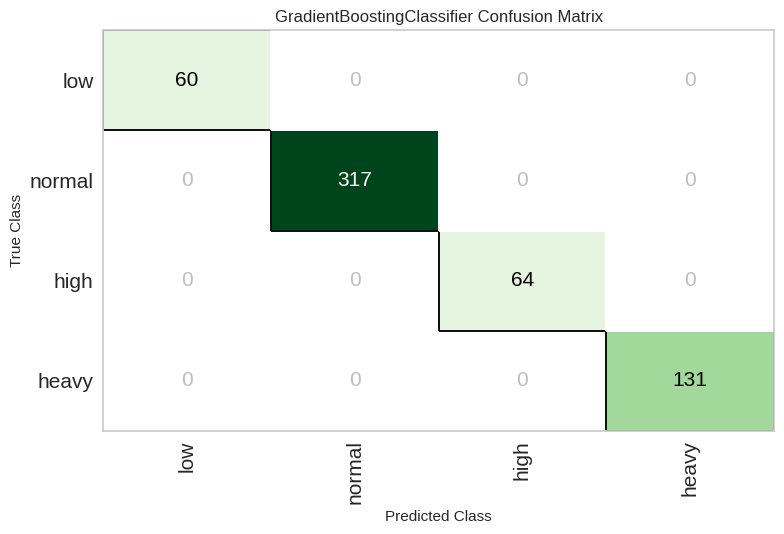

In [51]:
fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (5,5))

plot_model(estimator = best[0], 
           plot = 'confusion_matrix',
           plot_kwargs = {'classes' : ['low', 'normal', 'high', 'heavy'], 'xlabel': 'prueba', }, )


plt.show()

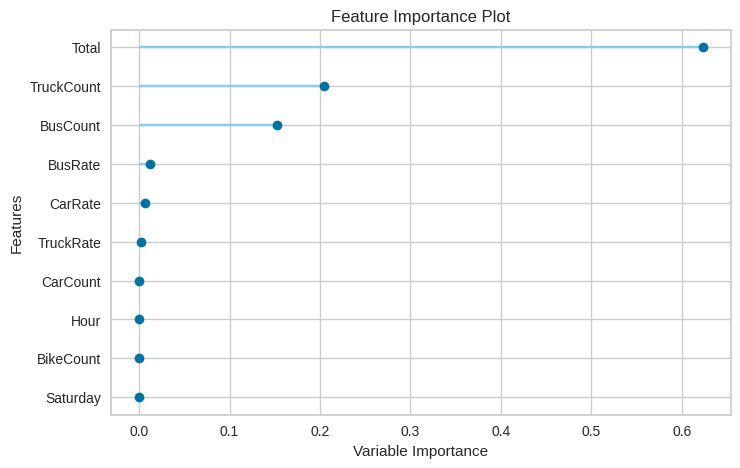

In [56]:
plot_model(best[0], plot = 'feature')

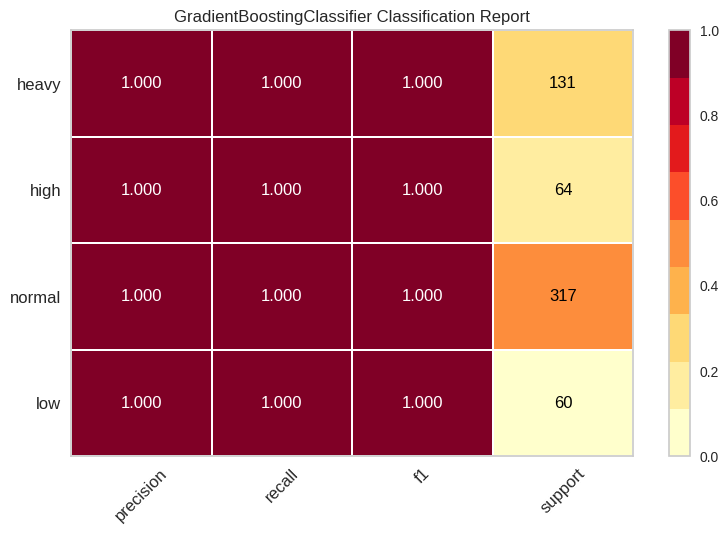

In [57]:
plot_model(best[0], plot = 'class_report', plot_kwargs = {'classes' : ['low', 'normal', 'high', 'heavy']})

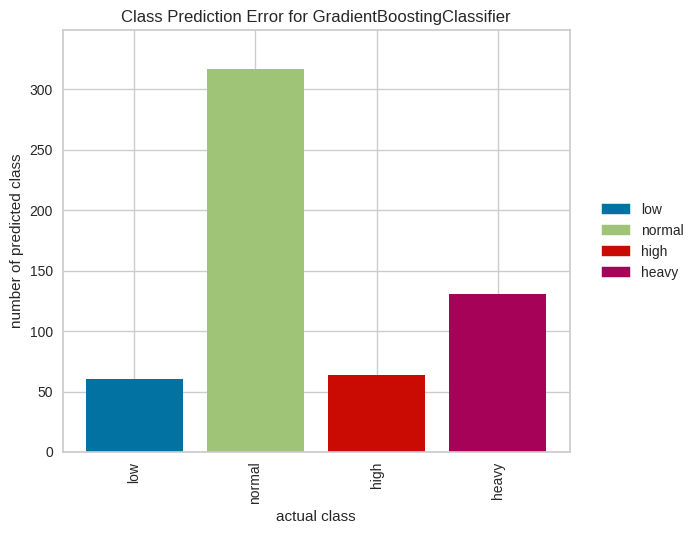

In [58]:
plot_model(best[0], plot = 'error', plot_kwargs = {'classes' : ['low', 'normal', 'high', 'heavy']})

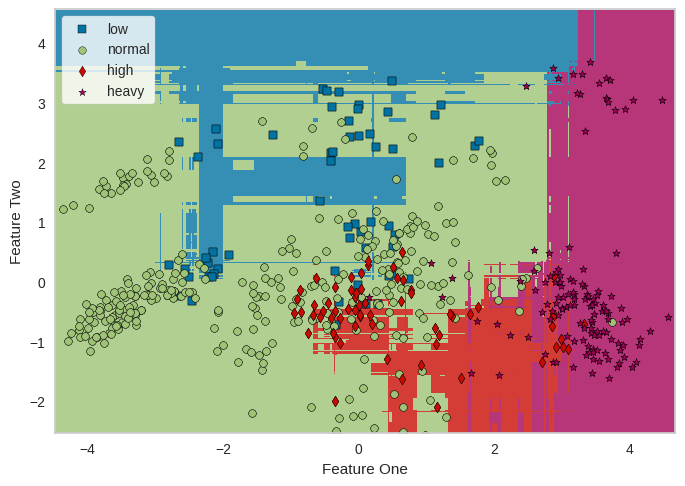

In [59]:
plot_model(best[0], plot = 'boundary', 
              plot_kwargs = {'classes' : ['low', 'normal', 'high', 'heavy']})

In [67]:
best[0]

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=42, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

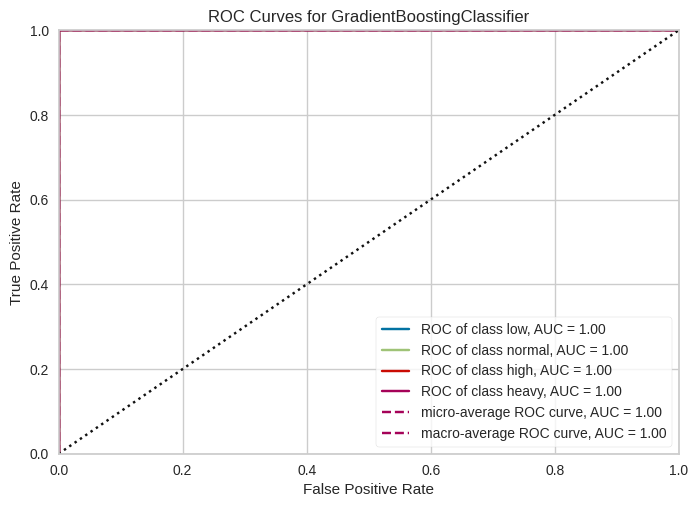

In [68]:
plot_model(best[0], plot = 'auc', 
              plot_kwargs = {'classes' : ['low', 'normal', 'high', 'heavy']})

In [69]:
evaluate_model(best[0],plot_kwargs = {'classes' : ['low', 'normal', 'high', 'heavy']})

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [70]:
eda()

Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (1837, 16)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    15 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Multi_Classification problem #####################


Row
    [0] WidgetBox
        [0] Select(name='y', options=['Hour', 'CarCount', ...], value='Hour')
    [1] ParamFunction(function, _pane=HoloViews)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['Hour', 'CarCount', ...], value='Hour')
        [1] Select(name='Y-Axis', options=['Hour', 'CarCount', ...], value='CarCount')
        [2] Select(name='Color', options=['None', 'Traffic S...], value='None')
    [1] ParamFunction(function, _pane=HoloViews)

Column
    [0] Row
        [0] HoloViews(DynamicMap, height=400, sizing_mode='fixed', width=600)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['Monday', 'Tuesday', ...], value='Monday', width=250)
            [1] VSpacer()

Column
    [0] Row
        [0] HoloViews(DynamicMap, height=400, sizing_mode='fixed', width=600)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['BusCount', 'CarRate', ...], value='BusCount', width=250)
            [1] VSpacer()

HoloViews(DynamicMap)

HoloViews(Layout)

No date vars could be found in data set


HoloViews(Overlay, height=500, sizing_mode='fixed', width=600)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['Monday', 'Tuesday', ...], value='Monday')
        [1] Select(name='Y-Axis', options=['Hour', 'CarCount', ...], value='Hour')
    [1] ParamFunction(function, _pane=HoloViews)

Time to run AutoViz (in seconds) = 2


In [71]:
predict_model(best[0])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


,Hour,CarCount,BikeCount,BusCount,TruckCount,Total,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,CarRate,TruckRate,BusRate,Traffic Situation,prediction_label,prediction_score
1127,10:15,27,16,36,30,109,0,1,0,0,0,0,0,24.770641,27.522936,33.027523,1,1,0.9999
1465,16:00,120,32,39,9,200,0,1,0,0,0,0,0,60.000000,4.500000,19.500000,3,3,1.0000
2359,22:45,15,4,1,32,52,0,0,0,1,0,0,0,28.846153,61.538460,1.923077,1,1,1.0000
2270,22:30,12,0,1,17,30,0,0,0,0,1,0,0,40.000000,56.666668,3.333333,1,1,1.0000
1148,23:15,13,2,0,22,37,0,0,0,0,0,0,1,35.135136,59.459461,0.000000,1,1,1.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189,16:45,140,25,46,10,221,0,0,1,0,0,0,0,63.348415,4.524887,20.814480,3,3,1.0000
1593,19:30,50,16,16,11,93,0,0,0,1,0,0,0,53.763439,11.827957,17.204302,1,1,0.9998
2098,00:30,16,1,0,14,31,0,0,1,0,0,0,0,51.612904,45.161289,0.000000,1,1,1.0000
1966,06:15,112,13,39,0,164,0,0,0,0,0,0,1,68.292686,0.000000,23.780487,2,2,0.9994


Una vez construido los modelos, seleccionamos el algoritmo que mejor resultado ha dado y pronosticamos sobre las 476 muestras que hemos separado del dataset `train`. Estas muestras no han sido utilizadas en la modelización, por lo que será una buena forma de validar nuestro algoritmo. En la tabla \ref{tab:gbc-crosstab} se muestra la situación real observada de estas 476 observaciones (filas) y la clasificación dada por el algoritmo (columnas). Observamos que el algoritmo ha clasificado correctamente todas las muestras.

In [106]:
predict_model_0 = predict_model(best[0], data = validation, raw_score = True)[['Traffic Situation', 'prediction_label']]
predict_model_0.replace({0: 'low', 1: 'normal', 2: 'high', 3: 'heavy'}, inplace = True)
predict_model_0.prediction_label = pd.Categorical(predict_model_0.prediction_label, categories = ['low', 'normal', 'high', 'heavy'])
pd.crosstab(predict_model_0['Traffic Situation'], predict_model_0['prediction_label'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.0000,0.2551,0,0,0,0,0


prediction_label,low,normal,high,heavy
Traffic Situation,,,,
low,37,0,0,0
normal,0,274,0,0
high,0,0,46,0
heavy,0,0,0,119


Creamos un modelo _Gradient Boosting Classifier_ y analizamos su rendimiento en las diferentes validaciones cruzadas.

In [73]:
gbc = create_model(estimator = 'gbc', fold = 10, return_train_score = True, cross_validation = True)

Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,Parameters
ccp_alpha,0.0
criterion,friedman_mse
init,None
learning_rate,0.1
loss,deviance
max_depth,3
max_features,None
max_leaf_nodes,None
min_impurity_decrease,0.0
min_samples_leaf,1


El modelo _Gradient Boosting Classifier_ muestra un rendimiento promedio en la exactitud de 0,9484 en la validación cruzada. Aplicamos una optimización de los parámetros del modelo para intentar mejorar el rendimiento del modelo.

In [74]:
tuned_gbc = tune_model(gbc, search_library = 'optuna', optimize = 'acc', n_iter = 100)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9925,1.0000,0.9925,0.9930,0.9926,0.9881,0.9882
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9850,0.9999,0.9850,0.9854,0.9845,0.9752,0.9757
3,0.9925,0.9918,0.9925,0.9927,0.9925,0.9878,0.9879
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9925,0.9990,0.9925,0.9926,0.9924,0.9877,0.9878
6,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

[I 2023-12-15 08:54:45,909] Searching the best hyperparameters using 1332 samples...
[I 2023-12-15 09:05:39,778] Finished hyperparemeter search!


,Parameters
ccp_alpha,0.0
criterion,friedman_mse
init,None
learning_rate,0.27428321506284126
loss,deviance
max_depth,9
max_features,0.9315899619953828
max_leaf_nodes,None
min_impurity_decrease,8.184088139631635e-06
min_samples_leaf,5


In [105]:
predict_model_tuned = predict_model(tuned_gbc, data = validation, raw_score = True)[['Traffic Situation', 'prediction_label']]
predict_model_tuned.replace({0: 'low', 1: 'normal', 2: 'high', 3: 'heavy'}, inplace = True)
predict_model_tuned.prediction_label = pd.Categorical(predict_model_tuned.prediction_label, categories = ['low', 'normal', 'high', 'heavy'])
pd.crosstab(predict_model_tuned['Traffic Situation'], predict_model_tuned['prediction_label'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.0000,0.2489,0,0,0,0,0


prediction_label,low,normal,high,heavy
Traffic Situation,,,,
low,37,0,0,0
normal,0,271,0,3
high,0,2,44,0
heavy,0,1,0,118


In [76]:
gbc

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=42, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [77]:
tuned_gbc

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.27428321506284126, loss='deviance',
                           max_depth=9, max_features=0.9315899619953828,
                           max_leaf_nodes=None,
                           min_impurity_decrease=8.184088139631635e-06,
                           min_samples_leaf=5, min_samples_split=7,
                           min_weight_fraction_leaf=0.0, n_estimators=28,
                           n_iter_no_change=None, random_state=42,
                           subsample=0.48465273951953514, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

XGBoost (Extreme Gradient Boosting) es un poderoso algoritmo de aprendizaje automático utilizado principalmente para problemas de clasificación y regresión. Es una técnica de ensamblado que combina múltiples modelos de árboles de decisión débiles para crear un modelo más fuerte y preciso. A continuación damos una explicación detallada del algoritmo de clasificación XGBoost:

1. Árboles de decisión débiles:
   - XGBoost utiliza árboles de decisión como modelos base. Estos árboles se llaman "débiles" porque son simples y suelen tener poca profundidad, evitando así el sobreajuste.
   - Cada árbol de decisión toma un conjunto de características de entrada y realiza divisiones para separar los datos en grupos que tienen etiquetas similares.  

2. Gradient Boosting:
   - XGBoost utiliza una técnica de impulso (boosting) llamada Gradient Boosting. En lugar de entrenar un solo árbol de decisión, se construye una secuencia de árboles de decisión en forma de conjunto.
   - Inicialmente, se entrena un árbol de decisión simple en los datos. Luego, se calcula el error residual, que es la diferencia entre las etiquetas reales y las predicciones del primer árbol.
   - Luego, se entrena un segundo árbol para capturar este error residual, y el proceso continúa para construir árboles adicionales que corrigen los errores de los árboles anteriores.

3. Regularización:
   - XGBoost incorpora regularización en el proceso de entrenamiento para evitar el sobreajuste. Utiliza términos de penalización en la función de pérdida, lo que fomenta la simplicidad de los árboles y reduce la complejidad del modelo.

4. Función de pérdida personalizada:
   - XGBoost utiliza una función de pérdida personalizada que puede ser definida por el usuario, dependiendo de si se trata de un problema de clasificación o regresión.
   - Para la clasificación, se utiliza la función de pérdida de entropía cruzada logarítmica (logloss) de forma predeterminada.

5. Construcción de árboles de decisión:
   - XGBoost utiliza un algoritmo de construcción de árboles optimizado llamado "exact greedy algorithm." Este algoritmo encuentra divisiones óptimas para las características de entrada de manera eficiente.

6. Prunning (Poda):
   - XGBoost emplea la poda de árboles durante el proceso de creación para eliminar nodos que no contribuyen significativamente a la mejora de la función de pérdida.

7. Ensamblado:
   - Los árboles de decisión individuales se combinan para formar el modelo final de XGBoost. Las predicciones de estos árboles se ponderan y suman para obtener la predicción final.

8. Regularización L1 y L2:
   - XGBoost permite la aplicación de regularización L1 (Lasso) y L2 (Ridge) en los pesos de los árboles, lo que ayuda a controlar la complejidad del modelo y evitar el sobreajuste.

9. Parámetros ajustables:
   - XGBoost tiene una amplia variedad de hiperparámetros que se pueden ajustar para optimizar el rendimiento del modelo, como la profundidad máxima del árbol, la tasa de aprendizaje, el número de árboles, entre otros.

En resumen, XGBoost es un algoritmo de ensamblado basado en árboles de decisión que combina múltiples modelos débiles en un modelo más fuerte y preciso. Su capacidad para manejar regularización, funciones de pérdida personalizadas y parámetros ajustables lo convierten en una herramienta versátil y poderosa en el campo del aprendizaje automático.

Estos son algunos de los parámetros más importantes utilizados en el clasificador XGBoost. La configuración de estos parámetros puede tener un gran impacto en el rendimiento y la capacidad de generalización del modelo, por lo que es importante ajustarlos cuidadosamente según el problema que estés abordando.

1. `base_score`: El valor de puntuación base para los árboles de decisión antes de realizar cualquier ajuste.

2. `booster`: El tipo de modelo de ensamblado utilizado. En este caso, es "gbtree", lo que significa que se están utilizando árboles de decisión como base.

3. `colsample_bylevel`, `colsample_bynode`, `colsample_bytree`: Estos parámetros controlan la fracción de características que se muestrean al construir cada árbol. Determinan la aleatorización de las características en cada paso de creación del árbol.

4. `early_stopping_rounds`: Permite activar la detención temprana del entrenamiento si no se observa una mejora en la métrica de validación durante un número específico de rondas. Esto evita el sobreajuste.

5. `enable_categorical`: Indica si se deben habilitar las características categóricas. Esto es útil cuando se tienen características con valores categóricos en los datos.

6. `eval_metric`: La métrica utilizada para evaluar el rendimiento del modelo durante el entrenamiento. Puede ser especificada por el usuario.

7. `gamma`: Un parámetro de regularización que controla cuánto se requiere una reducción en la función de pérdida para realizar una división en un nodo del árbol.

8. `gpu_id`: El identificador de la GPU a utilizar, si se desea realizar entrenamiento en GPU.

9. `grow_policy`: Controla cómo crecen los árboles. "depthwise" significa que se crecen por profundidad, mientras que "lossguide" significa que se crecen por guía de pérdida.

10. `importance_type`: Define cómo se calcula la importancia de las características. Puede ser "gain", "weight", o "cover".

11. `interaction_constraints`: Restricciones de interacción entre características para controlar cómo interactúan las características entre sí.

12. `learning_rate`: La tasa de aprendizaje, que controla el tamaño de los pasos de actualización de los pesos del modelo durante el entrenamiento.

13. `max_bin`: El número máximo de bins (contenedores) para discretizar características continuas. Ayuda a controlar la complejidad del modelo.

14. `max_cat_to_onehot`: El número máximo de categorías a codificar en codificación one-hot. Ayuda a controlar el crecimiento del árbol en presencia de características categóricas.

15. `max_depth`: La profundidad máxima permitida para los árboles de decisión.

16. `min_child_weight`: El valor mínimo de la suma de los pesos de la muestra necesarios en un nodo hijo para continuar la partición.

17. `missing`: Valor que representa los valores faltantes en los datos.

18. `n_estimators`: El número de árboles (estimadores) en el ensamblado.

19. `n_jobs`: El número de núcleos de CPU a utilizar para el entrenamiento (-1 significa utilizar todos los núcleos disponibles).

20. `num_parallel_tree`: El número de árboles paralelos para construir durante el entrenamiento.

21. `objective`: La función de pérdida que se optimiza durante el entrenamiento. En este caso, es "multi:softprob", lo que indica que se está realizando una clasificación multi-clase.

22. `predictor`: El tipo de predictor a utilizar automáticamente. Puede ser "auto" o especificado por el usuario.

23. `random_state`: Semilla para la generación de números aleatorios, para asegurar la reproducibilidad del entrenamiento.

24. `reg_alpha`: Término de regularización L1 (Lasso) para los pesos de los árboles.

Gradient Boosting Classifier es un poderoso algoritmo de aprendizaje automático que se utiliza principalmente para problemas de clasificación. Forma parte de la familia de algoritmos de conjunto (ensemble), que combina múltiples modelos de aprendizaje débil para construir un modelo más fuerte y preciso. El proceso de boosting se basa en la idea de mejorar iterativamente el rendimiento del modelo, corrigiendo los errores de los modelos anteriores. Gradient Boosting Classifier es uno de los métodos de boosting más populares y efectivos.

A continuación, se describen los parámetros que has proporcionado para el constructor `GradientBoostingClassifier`:

  * `ccp_alpha`: Este parámetro se utiliza para la poda de costo-complejidad. Controla la complejidad del árbol de decisión inducido en cada iteración. Un valor mayor de `ccp_alpha` conducirá a una mayor poda del árbol y a modelos más simples.

  * `criterion`: Es el criterio utilizado para medir la calidad de una división en cada nodo del árbol. "friedman_mse" se refiere al criterio de Friedman para árboles de regresión, que también se utiliza en Gradient Boosting. Otras opciones incluyen MSE (error cuadrático medio) y MAE (error absoluto medio).

  * `init`: Puede proporcionar un estimador inicial si se desea. Por lo general, se deja en `None`.

  * `learning_rate`: Controla la tasa de aprendizaje del algoritmo. Determina la magnitud de las actualizaciones que se hacen en cada iteración. Un valor más bajo generalmente requiere más estimadores (n_estimators) para obtener un rendimiento similar, pero puede mejorar la generalización.

  * `loss`: Define la función de pérdida que se optimiza durante el entrenamiento. "deviance" se utiliza comúnmente para problemas de clasificación, que se refiere a la pérdida de entropía cruzada (logarítmica). Otros valores posibles son "exponential" y "deviance" para regresión.

  * `max_depth`: Limita la profundidad máxima de los árboles de decisión en el ensemble. Ayuda a controlar la complejidad del modelo y prevenir el sobreajuste.

  * `max_features`: Es el número máximo de características a considerar para cada división de nodo. Puede ser un valor entero o una fracción.

  * `min_impurity_decrease`: Establece el umbral mínimo para considerar una división en un nodo. Ayuda a controlar la creación de divisiones y, por lo tanto, la complejidad del árbol.

  * `min_samples_leaf` y `min_samples_split`: Estos parámetros controlan el número mínimo de muestras requeridas en una hoja y un nodo interno, respectivamente.

  * `n_estimators`: Indica el número de estimadores (árboles de decisión) que se utilizarán en el ensemble.

  * `random_state`: Controla la semilla para la generación de números aleatorios, asegurando que los resultados sean reproducibles.

  * `subsample`: Controla la fracción de muestras utilizadas para ajustar los estimadores en cada iteración. Un valor menor a 1.0 permite la creación de ensambles estocásticos.

  * `tol`: Define la tolerancia para la parada temprana basada en la pérdida.

  * `validation_fraction`: Es la fracción de datos que se reserva como conjunto de validación para la parada temprana.

  * `verbose`: Controla la cantidad de información de registro que se muestra durante el entrenamiento.

  * `warm_start`: Si se establece en True, permite la reutilización del resultado anterior del ajuste para entrenar modelos adicionales de manera incremental.

En resumen, _Gradient Boosting Classifier_ es un algoritmo versátil y potente que puede utilizarse para abordar una variedad de problemas de clasificación. Los parámetros mencionados anteriormente permiten ajustar y personalizar el comportamiento del algoritmo según las necesidades específicas de tu problema de aprendizaje automático.

https://colab.research.google.com/github/pycaret/pycaret/blob/master/tutorials/Tutorial%20-%20Multiclass%20Classification.ipynb

https://www.kaggle.com/code/ztrollk/movie-genre-prediction-with-pycaret

https://www.pycaret.org/tutorials/html/CLF101.html

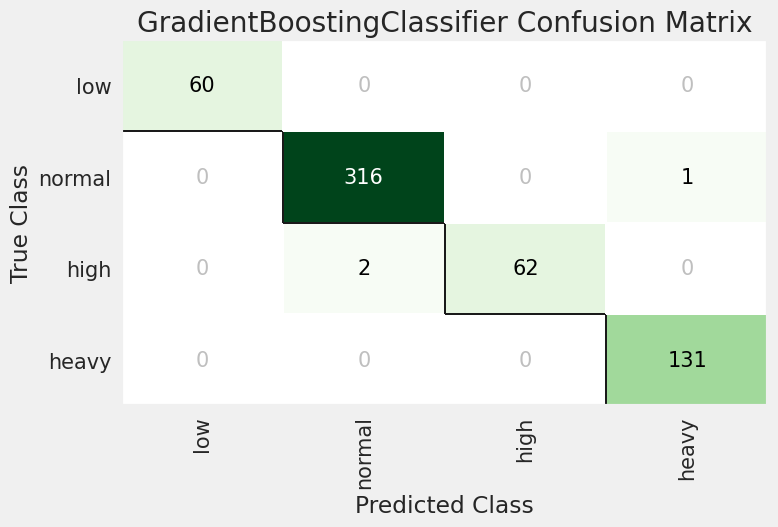

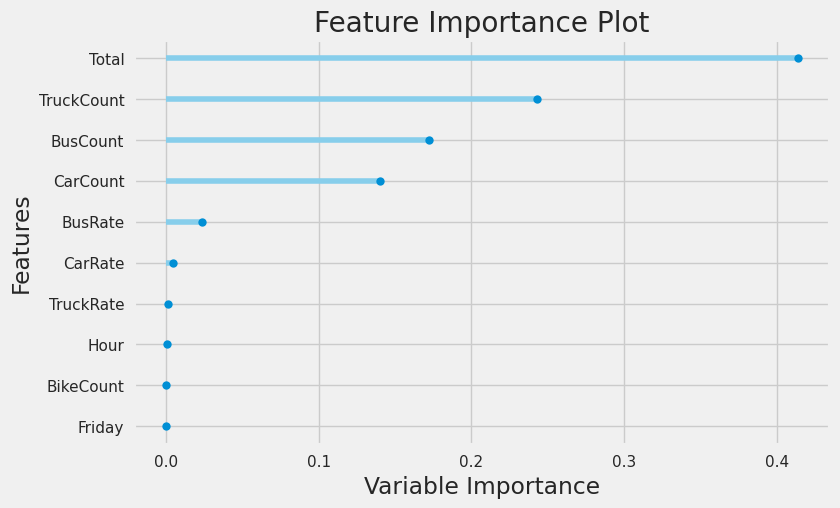

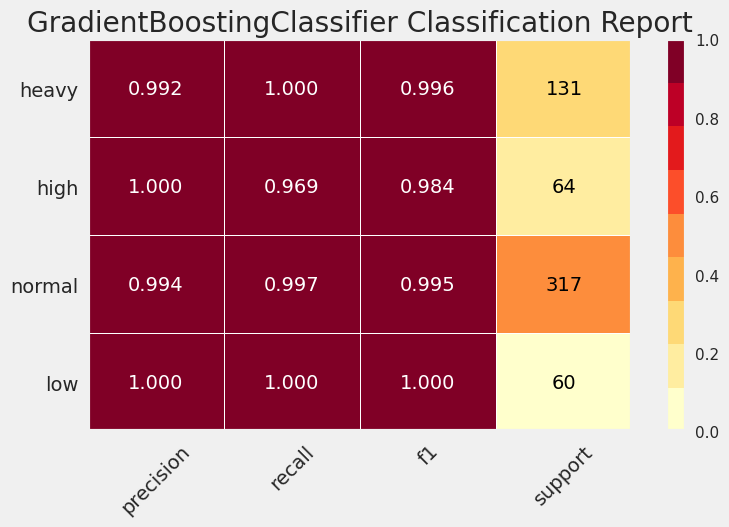

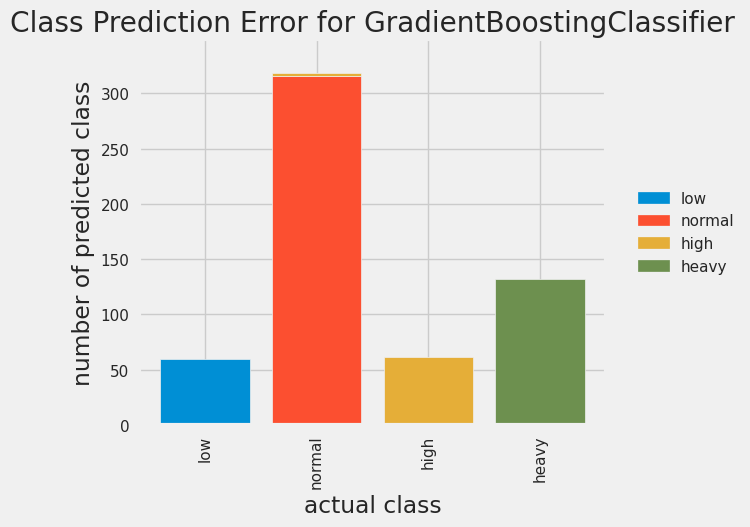

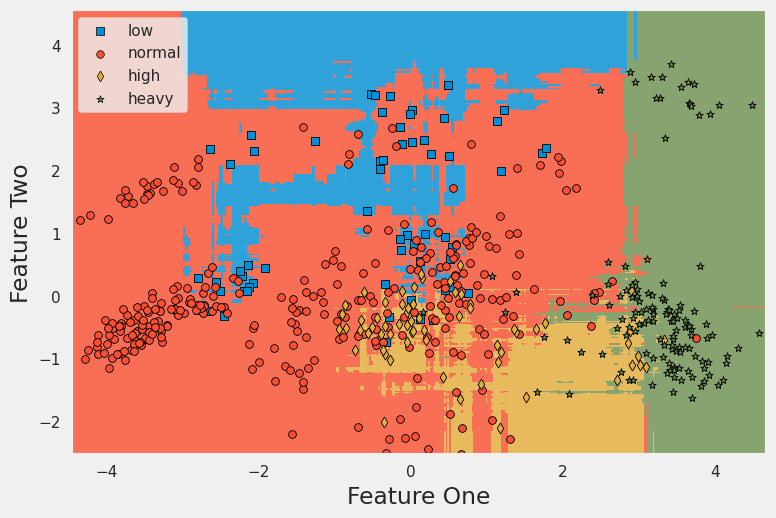

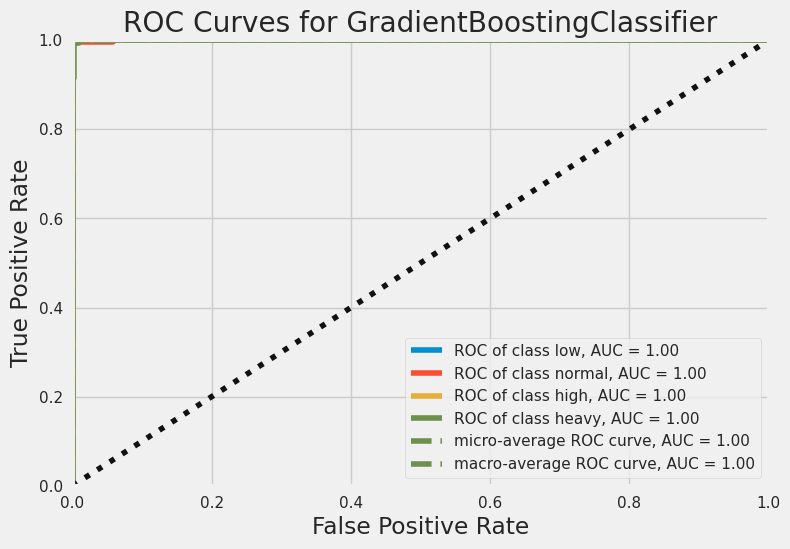

In [78]:
ESTIMATOR_ = tuned_gbc

for PLOT_ in ['confusion_matrix', 'feature', 'class_report', 'error', 'boundary', 'auc']:

    plot_model(estimator = ESTIMATOR_, 
               plot = PLOT_,
               scale = 1.0,
               fold = 10, 
               save = True,
               plot_kwargs = {'classes' : ['low', 'normal', 'high', 'heavy']})
    plot_model(estimator = ESTIMATOR_, 
               plot = PLOT_,
               scale = 1.0,
               fold = 10, 
               save = False,
               plot_kwargs = {'classes' : ['low', 'normal', 'high', 'heavy']})
    # plot_model(estimator = tuned_xgboost, 
    #            plot = PLOT_,
    #            scale = 1.0,
    #            fold = 10, 
    #            save = False,
    #            plot_kwargs = {'classes' : ['low', 'normal', 'high', 'heavy']})

### Evaluación del rendimiento

#### Matriz de Confusión

La matriz de confusión es una herramienta fundamental en la evaluación de modelos de clasificación, ya que proporciona una visión detallada de cómo se están realizando las predicciones en diferentes clases. En la figura \ref{fig:xgboost-confusion-matrix} mostramos la clasificación observada en el eje vertical (_True Class_) y la clasificación pronosticada en el eje horizontal (_Predicted Class_). Cada celda de la matriz representa el número de sujetos que caen en una categoría específica de clasificación.

Una característica esencial de la matriz de confusión es su capacidad para visualizar tanto los aciertos como los errores del modelo. La diagonal principal de la matriz (de arriba a la izquierda a abajo a la derecha) muestra los casos en los que el modelo ha clasificado correctamente las instancias. Esto significa que los valores en esta diagonal representan los verdaderos positivos (_True Positives_) y verdaderos negativos (_True Negatives_).

Por otro lado, las celdas fuera de la diagonal principal indican los errores de clasificación. En resumen, la matriz de confusión es una herramienta esencial para comprender el rendimiento de un modelo de clasificación y evaluar su capacidad para distinguir entre diferentes clases. Facilita la identificación de patrones de aciertos y errores, lo que nos puede ayudar en la toma de decisiones para mejorar el modelo o ajustar su configuración.

#### Informe de Clases

El informe de clases (_Class Report_) es una herramienta esencial en la evaluación detallada del rendimiento de un modelo de clasificación multiclase. En la figura \ref{fig:xgboost-class-report} se presentan métricas cruciales que permiten evaluar la capacidad del modelo para predecir con precisión y exhaustividad cada una de las categorías de interés: Low, Normal, High y Heavy.

La métrica de precisión (precision) indica la proporción de predicciones positivas realizadas por el modelo que son realmente correctas para una clase específica. Es decir, mide la capacidad del modelo para evitar falsos positivos. El recall (recall), por otro lado, representa la proporción de casos verdaderos positivos que el modelo ha identificado correctamente para una clase en particular. Es una medida de la exhaustividad del modelo, su capacidad para evitar falsos negativos. El F1-score es una métrica que combina tanto la precisión como el recall en una sola puntuación, proporcionando una medida equilibrada del rendimiento del modelo. Es especialmente útil cuando se busca un equilibrio entre la precisión y la exhaustividad. Por último, el soporte (support) indica la cantidad de muestras en el conjunto de datos que pertenecen a cada clase. Proporciona información sobre el número de casos en cada categoría y puede ser útil para identificar clases con un soporte bajo que pueden requerir una atención especial.

#### Decisión de Frontera

En la figura \ref{fig:xgboost-decision-boundary} podemos ver un gráfico de decisión de frontera, también conocido como _Decision Boundary Plot_ en inglés, es una visualización que muestra cómo un modelo de aprendizaje automático divide o clasifica diferentes puntos de datos en un espacio bidimensional o tridimensional. Este tipo de gráfico es especialmente útil en el contexto de problemas de clasificación, donde el objetivo es separar observaciones en diferentes categorías o clases. El gráfico de decisión de frontera representa las fronteras de decisión del modelo, que son las líneas, curvas o superficies que demarcan las regiones donde el modelo asigna una clase particular. Estas fronteras de decisión se basan en las características de los datos y los parámetros del modelo y pueden ser lineales o no lineales, dependiendo del algoritmo utilizado.

#### Error de Predicción

Una figura de error de predicción (_Prediction Error_) es una visualización que nos permite evaluar cómo un modelo de aprendizaje automático se desempeña en términos de sus predicciones en comparación con los valores reales de los datos. Esta figura destaca las discrepancias entre las predicciones del modelo y las observaciones verdaderas.

#### Importancia de las Características

Un gráfico de importancia de características (_Feature Importance_) es una herramienta clave en la evaluación de modelos de aprendizaje automático. Este gráfico resalta la influencia relativa de las diferentes variables o características en la toma de decisiones del modelo. En otras palabras, muestra cuánto contribuye cada característica a las predicciones del modelo. A través de este gráfico, podemos identificar cuáles son las características más relevantes o informativas para el modelo y cuáles tienen un impacto menor en sus predicciones. Esto es especialmente útil para comprender qué aspectos de los datos están influyendo más en el rendimiento del modelo y puede ayudar en la toma de decisiones sobre la selección de características o en la interpretación de los resultados.

#### AUC

El gráfico de Área Bajo la Curva (AUC) es una herramienta fundamental en la evaluación de modelos de clasificación. Representa la capacidad de un modelo para distinguir entre clases o categorías en un problema de clasificación. El AUC es una métrica que cuantifica la calidad del modelo, donde un valor más alto indica un mejor rendimiento en la diferenciación de clases.

La figura \ref{fig:xgboost-auc} visualiza la relación entre la tasa de verdaderos positivos (_True Positives_) y la tasa de falsos positivos (_False Positives_) en función de diferentes umbrales de decisión. Cuanto mayor sea el AUC, mejor será el poder de discriminación del modelo, lo que significa que es capaz de clasificar con precisión las instancias positivas y negativas en un conjunto de datos. En resumen, el gráfico de AUC es una herramienta esencial para evaluar la capacidad de un modelo de clasificación para tomar decisiones precisas y distinguir entre diferentes clases, lo que lo convierte en una métrica crítica en la evaluación de la calidad del modelo.

https://pycaret.gitbook.io/docs/get-started/functions/analyze

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.9948,0.9999,0.9948,0.9948,0.9947,0.9915,0.9915


Found 96 subgroups. Evaluation may be slow


,Samples,Accuracy,Recall,Precision,F1,Kappa,MCC,Selection Rate
Hour,,,,,,,,
00:00,6,1.0,1.0,1.0,1.0,1.0,1.0,0.833333
00:15,6,1.0,1.0,1.0,1.0,1.0,1.0,0.833333
00:30,7,1.0,1.0,1.0,1.0,1.0,1.0,0.428571
00:45,6,1.0,1.0,1.0,1.0,NaN,0.0,1.0
01:00,5,1.0,1.0,1.0,1.0,NaN,0.0,1.0
01:15,10,1.0,1.0,1.0,1.0,NaN,0.0,1.0
01:30,6,1.0,1.0,1.0,1.0,NaN,0.0,1.0
01:45,5,1.0,1.0,1.0,1.0,NaN,0.0,1.0
02:00,6,1.0,1.0,1.0,1.0,1.0,1.0,0.833333


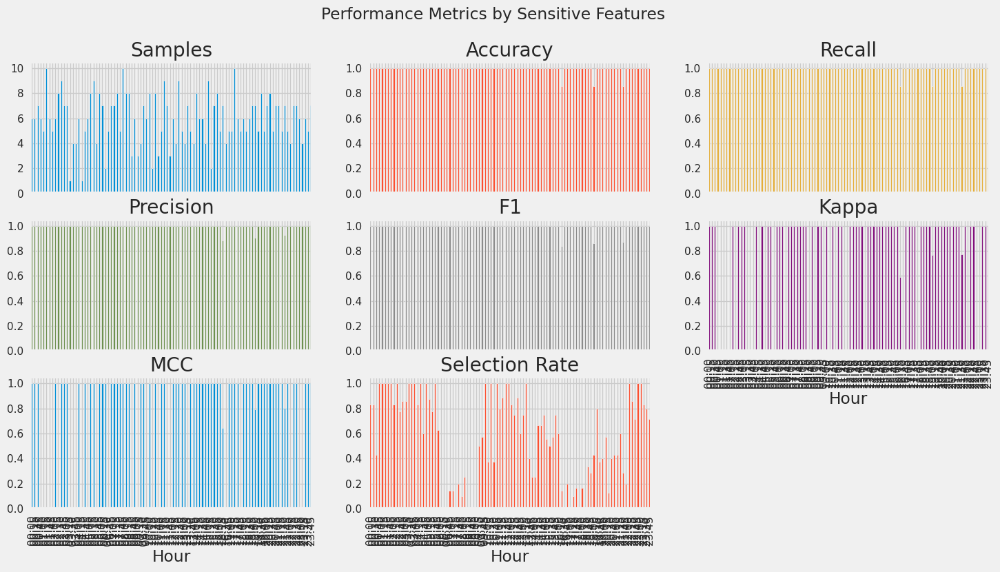

In [79]:
check_fairness(tuned_gbc, sensitive_features = ['Hour'])

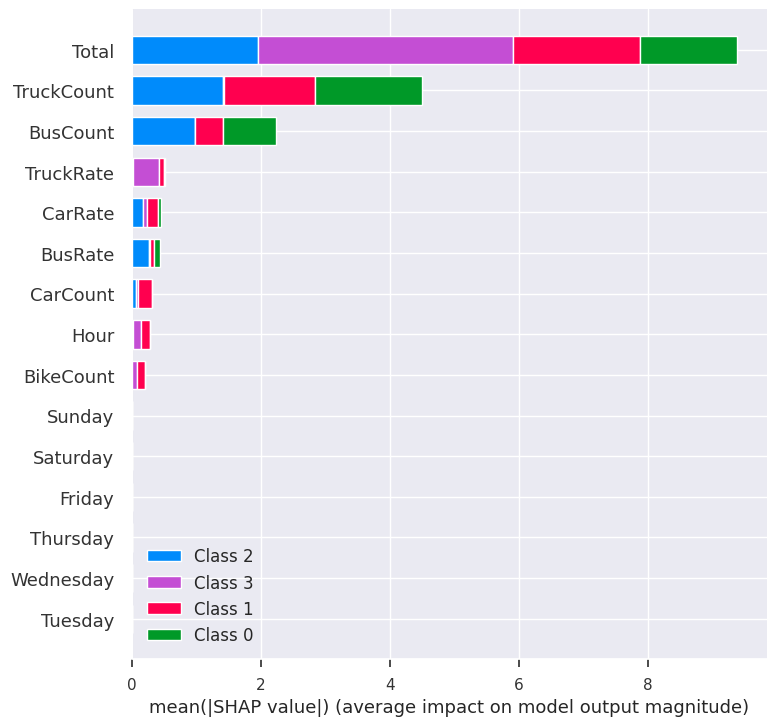

In [67]:
interpret_model(tuned_xgboost, plot = 'summary',)

## Predicción

In [80]:
predict_model(tuned_gbc)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.9948,0.9999,0.9948,0.9948,0.9947,0.9915,0.9915


,Hour,CarCount,BikeCount,BusCount,TruckCount,Total,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,CarRate,TruckRate,BusRate,Traffic Situation,prediction_label,prediction_score
1127,10:15,27,16,36,30,109,0,1,0,0,0,0,0,24.770641,27.522936,33.027523,1,1,0.9996
1465,16:00,120,32,39,9,200,0,1,0,0,0,0,0,60.000000,4.500000,19.500000,3,3,0.9999
2359,22:45,15,4,1,32,52,0,0,0,1,0,0,0,28.846153,61.538460,1.923077,1,1,0.9999
2270,22:30,12,0,1,17,30,0,0,0,0,1,0,0,40.000000,56.666668,3.333333,1,1,0.9999
1148,23:15,13,2,0,22,37,0,0,0,0,0,0,1,35.135136,59.459461,0.000000,1,1,0.9999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189,16:45,140,25,46,10,221,0,0,1,0,0,0,0,63.348415,4.524887,20.814480,3,3,0.9993
1593,19:30,50,16,16,11,93,0,0,0,1,0,0,0,53.763439,11.827957,17.204302,1,1,0.9994
2098,00:30,16,1,0,14,31,0,0,1,0,0,0,0,51.612904,45.161289,0.000000,1,1,0.9998
1966,06:15,112,13,39,0,164,0,0,0,0,0,0,1,68.292686,0.000000,23.780487,2,2,0.9990


In [81]:
predict_model(tuned_gbc, data = test)

,Hour,CarCount,BikeCount,BusCount,TruckCount,Total,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,CarRate,TruckRate,BusRate,prediction_label,prediction_score
0,01:00,15,5,0,10,30,0,0,0,0,0,1,0,14.851485,9.900990,0.000000,0,0.9995
1,20:30,86,15,15,23,139,0,0,1,0,0,0,0,43.434345,11.616161,7.575758,2,0.9992
2,21:45,102,5,19,11,137,0,1,0,0,0,0,0,54.255318,5.851064,10.106383,1,0.9998
3,06:45,109,14,38,1,162,0,0,0,0,0,0,1,71.241829,0.653595,24.836601,2,0.9988
4,00:15,14,2,1,26,43,0,0,0,0,0,0,1,10.852714,20.155039,0.775194,1,0.9999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
591,06:00,129,31,36,1,197,0,1,0,0,0,0,0,163.291138,1.265823,45.569622,3,0.9997
592,06:15,123,27,22,4,176,1,0,0,0,0,0,0,170.833328,5.555555,30.555555,3,0.9995
593,01:30,20,3,1,32,56,0,1,0,0,0,0,0,58.823528,94.117645,2.941176,1,0.9999
594,07:15,147,26,40,0,213,1,0,0,0,0,0,0,350.000000,0.000000,95.238098,3,0.9997


In [82]:
predict_model(tuned_gbc, data = test, raw_score = True)

,Hour,CarCount,BikeCount,BusCount,TruckCount,Total,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,CarRate,TruckRate,BusRate,prediction_label,prediction_score_0,prediction_score_1,prediction_score_2,prediction_score_3
0,01:00,15,5,0,10,30,0,0,0,0,0,1,0,14.851485,9.900990,0.000000,0,0.9995,0.0005,0.0000,0.0000
1,20:30,86,15,15,23,139,0,0,1,0,0,0,0,43.434345,11.616161,7.575758,2,0.0000,0.0007,0.9992,0.0000
2,21:45,102,5,19,11,137,0,1,0,0,0,0,0,54.255318,5.851064,10.106383,1,0.0001,0.9998,0.0001,0.0001
3,06:45,109,14,38,1,162,0,0,0,0,0,0,1,71.241829,0.653595,24.836601,2,0.0001,0.0010,0.9988,0.0001
4,00:15,14,2,1,26,43,0,0,0,0,0,0,1,10.852714,20.155039,0.775194,1,0.0000,0.9999,0.0000,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
591,06:00,129,31,36,1,197,0,1,0,0,0,0,0,163.291138,1.265823,45.569622,3,0.0001,0.0001,0.0001,0.9997
592,06:15,123,27,22,4,176,1,0,0,0,0,0,0,170.833328,5.555555,30.555555,3,0.0001,0.0002,0.0002,0.9995
593,01:30,20,3,1,32,56,0,1,0,0,0,0,0,58.823528,94.117645,2.941176,1,0.0001,0.9999,0.0000,0.0000
594,07:15,147,26,40,0,213,1,0,0,0,0,0,0,350.000000,0.000000,95.238098,3,0.0000,0.0001,0.0001,0.9997


## Comprobación

No tenemos la clasificación real del conjunto de datset de validación pero podemos ver gráficamente si las predicciones que ofrece nuestro modelo son similares a las que podemos observar con los datos de entrenamiento. 

De forma general, podemos ver el comportamiento de las muestra de entrenamiento en la figura \ref{fig:traffic-situation-train-by-vehicle-day-and-hour} y de las muestras de validación en la figura \ref{fig:traffic-situation-test-by-vehicle-day-and-hour}.

Vamos a realizar una serie de gráficos en los que mostremos la relación entre el total de vehículos entrando en el polígono industrial y el número de coches mostrando la información de la situación del tráfico. Esto lo haremos para cada día de la semana, ya que hemos visto que el comportamiento no es el mismo todos los días y además vamos a considerar lo que hemos obtenido en el conjunto de datos de validación. El perfil de mostrado en los datos de entrenamiento y los datos de validación debe ser similar y esto nos dará una idea de la aproximación de nuestro modelo. Este análisis lo haremos considerando el número de coches (figura \ref{fig:traffic-situation-train-test-by-carcount-day-and-hour}), el número de camiones (figura \ref{fig:traffic-situation-train-test-by-truckcount-day-and-hour}) y el número de autobuses (figura \ref{fig:traffic-situation-train-test-by-buscount-day-and-hour}).

In [83]:
pd.concat([
    predict_model(tuned_gbc, data = test)[['Hour', 'CarCount', 'BikeCount', 'BusCount', 'TruckCount', 'Total', 'prediction_label']],
    pd.read_csv('../data/test_datos-trafico.csv',)['Day of the week']], axis = 1)\
    .rename(columns = {'prediction_label': 'Traffic Situation'})\
    .loc[:, ['Hour', 'Day of the week', 'CarCount', 'BikeCount', 'BusCount', 'TruckCount', 'Total', 'Traffic Situation']]

,Hour,Day of the week,CarCount,BikeCount,BusCount,TruckCount,Total,Traffic Situation
0,01:00,Saturday,15,5,0,10,30,0
1,20:30,Wednesday,86,15,15,23,139,2
2,21:45,Tuesday,102,5,19,11,137,1
3,06:45,Sunday,109,14,38,1,162,2
4,00:15,Sunday,14,2,1,26,43,1
...,...,...,...,...,...,...,...,...
591,06:00,Tuesday,129,31,36,1,197,3
592,06:15,Monday,123,27,22,4,176,3
593,01:30,Tuesday,20,3,1,32,56,1
594,07:15,Monday,147,26,40,0,213,3


In [84]:
pd.concat([
    predict_model(tuned_gbc, data = test)[['Hour', 'CarCount', 'BikeCount', 'BusCount', 'TruckCount', 'Total', 'prediction_label']],
    pd.read_csv('../data/test_datos-trafico.csv',)['Day of the week']], axis = 1)\
    .rename(columns = {'prediction_label': 'Traffic Situation'})\
    .loc[:, ['Hour', 'Day of the week', 'CarCount', 'BikeCount', 'BusCount', 'TruckCount', 'Total', 'Traffic Situation']]\
    .replace({'Traffic Situation': {0: 'low', 1: 'normal', 2: 'high', 3: 'heavy'}})

,Hour,Day of the week,CarCount,BikeCount,BusCount,TruckCount,Total,Traffic Situation
0,01:00,Saturday,15,5,0,10,30,low
1,20:30,Wednesday,86,15,15,23,139,high
2,21:45,Tuesday,102,5,19,11,137,normal
3,06:45,Sunday,109,14,38,1,162,high
4,00:15,Sunday,14,2,1,26,43,normal
...,...,...,...,...,...,...,...,...
591,06:00,Tuesday,129,31,36,1,197,heavy
592,06:15,Monday,123,27,22,4,176,heavy
593,01:30,Tuesday,20,3,1,32,56,normal
594,07:15,Monday,147,26,40,0,213,heavy


In [85]:
pd.concat([
    predict_model(tuned_gbc, data = test)[['Hour', 'CarCount', 'BikeCount', 'BusCount', 'TruckCount', 'Total', 'prediction_label']],
    pd.read_csv('../data/test_datos-trafico.csv',)['Day of the week']], axis = 1)\
    .rename(columns = {'prediction_label': 'Traffic Situation'})\
    .loc[:, ['Hour', 'Day of the week', 'CarCount', 'BikeCount', 'BusCount', 'TruckCount', 'Total', 'Traffic Situation']]\
    .replace({'Traffic Situation': {0: 'low', 1: 'normal', 2: 'high', 3: 'heavy'}})\
    .to_csv('TraficoDataEvaluado_IBON_v01.csv', index = False)

In [86]:
train = pd.read_csv('../data/train_datos-trafico.csv',)

train.Time = list(map(change_am_pm_24, train.Time))
train['Hour'] = [str(x)[11:16] for x in train.Time]

train[['Hour', 'Day of the week', 'CarCount', 'BikeCount', 'BusCount', 'TruckCount', 'Total', 'Traffic Situation']]

,Hour,Day of the week,CarCount,BikeCount,BusCount,TruckCount,Total,Traffic Situation
0,05:15,Thursday,64,27,5,5,101,low
1,07:15,Sunday,150,13,31,4,198,heavy
2,07:00,Tuesday,134,10,44,0,188,heavy
3,05:45,Sunday,108,24,2,19,153,normal
4,20:15,Tuesday,80,14,20,15,129,normal
...,...,...,...,...,...,...,...,...
2375,01:30,Friday,20,2,0,17,39,normal
2376,09:45,Sunday,98,21,10,5,134,normal
2377,18:30,Sunday,116,22,23,7,168,heavy
2378,11:30,Monday,40,9,15,28,92,normal


In [87]:
data_train_test = \
pd.concat([
    train[['Hour', 'Day of the week', 'CarCount', 'BikeCount', 'BusCount', 'TruckCount', 'Total', 'Traffic Situation']],
    
    pd.concat([
        predict_model(tuned_gbc, data = test)[['Hour', 'CarCount', 'BikeCount', 'BusCount', 'TruckCount', 'Total', 'prediction_label']],
        pd.read_csv('../data/test_datos-trafico.csv',)['Day of the week']], axis = 1)\
        .rename(columns = {'prediction_label': 'Traffic Situation'})\
        .loc[:, ['Hour', 'Day of the week', 'CarCount', 'BikeCount', 'BusCount', 'TruckCount', 'Total', 'Traffic Situation']]
    ], axis = 0, keys = ['train', 'test'])\
    .reset_index()\
    .drop(columns = ['level_1'])\
    .rename(columns = {'level_0': 'Cohort'})\
    .replace({'Traffic Situation': {0: 'low', 1: 'normal', 2: 'high', 3: 'heavy'}})
data_train_test

,Cohort,Hour,Day of the week,CarCount,BikeCount,BusCount,TruckCount,Total,Traffic Situation
0,train,05:15,Thursday,64,27,5,5,101,low
1,train,07:15,Sunday,150,13,31,4,198,heavy
2,train,07:00,Tuesday,134,10,44,0,188,heavy
3,train,05:45,Sunday,108,24,2,19,153,normal
4,train,20:15,Tuesday,80,14,20,15,129,normal
...,...,...,...,...,...,...,...,...,...
2971,test,06:00,Tuesday,129,31,36,1,197,heavy
2972,test,06:15,Monday,123,27,22,4,176,heavy
2973,test,01:30,Tuesday,20,3,1,32,56,normal
2974,test,07:15,Monday,147,26,40,0,213,heavy


In [88]:
data_train_test['Hourf'] = [int(str(x)[0:2]) + int(str(x)[3:5])/100 for x in data_train_test.Hour]

In [89]:
data_train_test

,Cohort,Hour,Day of the week,CarCount,BikeCount,BusCount,TruckCount,Total,Traffic Situation,Hourf
0,train,05:15,Thursday,64,27,5,5,101,low,5.15
1,train,07:15,Sunday,150,13,31,4,198,heavy,7.15
2,train,07:00,Tuesday,134,10,44,0,188,heavy,7.00
3,train,05:45,Sunday,108,24,2,19,153,normal,5.45
4,train,20:15,Tuesday,80,14,20,15,129,normal,20.15
...,...,...,...,...,...,...,...,...,...,...
2971,test,06:00,Tuesday,129,31,36,1,197,heavy,6.00
2972,test,06:15,Monday,123,27,22,4,176,heavy,6.15
2973,test,01:30,Tuesday,20,3,1,32,56,normal,1.30
2974,test,07:15,Monday,147,26,40,0,213,heavy,7.15


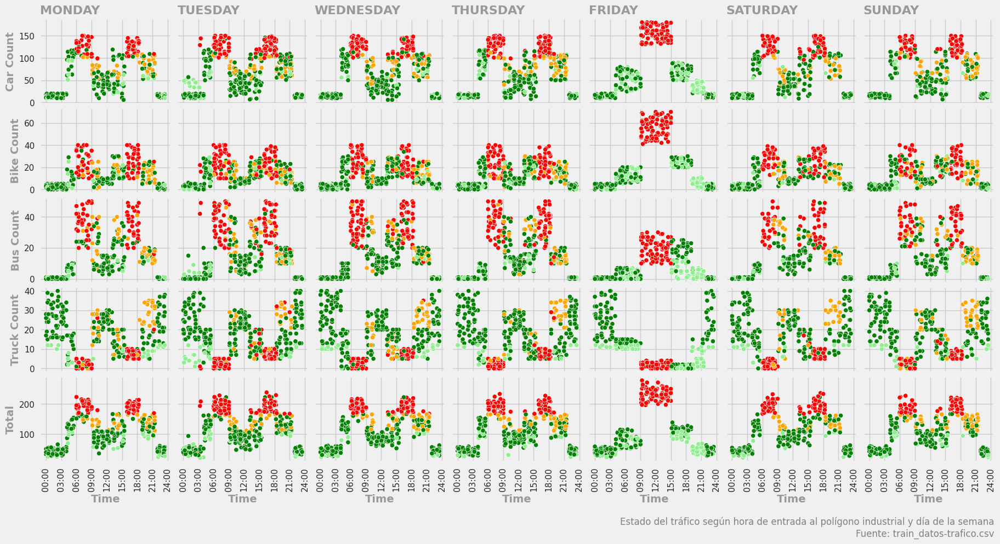

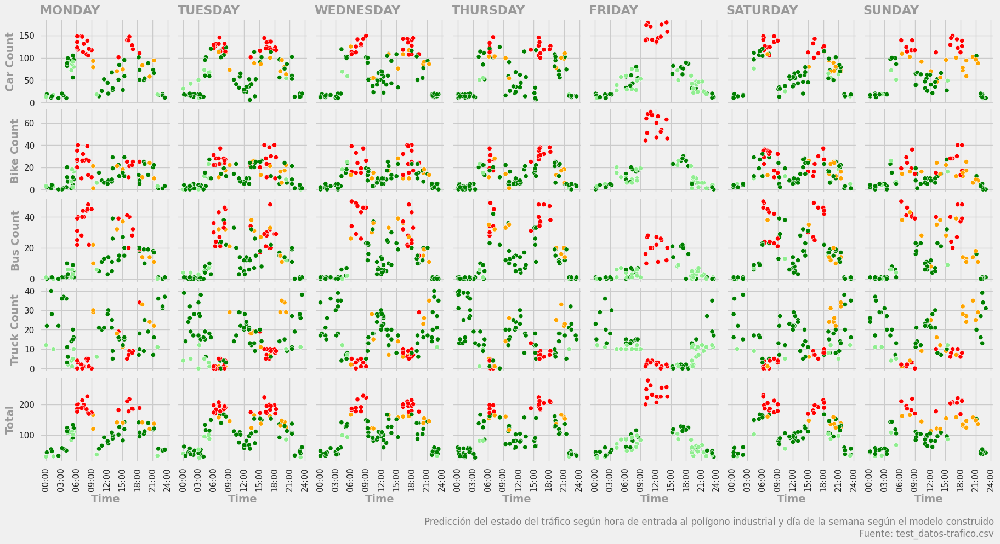

In [90]:
fig, axes = plt.subplots(nrows = 5, ncols = 7, figsize = (20,10), sharey = 'row', sharex = True)

DAYS_ = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
VEHICLES_ = ['CarCount', 'BikeCount', 'BusCount', 'TruckCount']
COHORT_ = 'train'

for ax,day in zip(axes[0,:].flat, DAYS_): #,day,vehicle in zip(axes.flat, DAYS_, VEHICLES_):
  
    g = sns.scatterplot(x = 'Hourf', y = 'CarCount', 
                        hue = 'Traffic Situation', 
                        palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
                        style = 'Cohort',
                        data = data_train_test.loc[(data_train_test['Day of the week'] == day) & (data_train_test['Cohort'] == COHORT_), :], 
                        ax = ax, legend = None)

for ax,day in zip(axes[1,:].flat, DAYS_): 
    
    g = sns.scatterplot(x = 'Hourf', y = 'BikeCount', 
                        hue = 'Traffic Situation', 
                        palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
                        style = 'Cohort',
                        data = data_train_test.loc[(data_train_test['Day of the week'] == day) & (data_train_test['Cohort'] == COHORT_), :], 
                        ax = ax, legend = None)
    
for ax,day in zip(axes[2,:].flat, DAYS_): 

    g = sns.scatterplot(x = 'Hourf', y = 'BusCount', 
                        hue = 'Traffic Situation', 
                        palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
                        style = 'Cohort',
                        data = data_train_test.loc[(data_train_test['Day of the week'] == day) & (data_train_test['Cohort'] == COHORT_), :], 
                        ax = ax, legend = None)
    
for ax,day in zip(axes[3,:].flat, DAYS_): 

    g = sns.scatterplot(x = 'Hourf', y = 'TruckCount', 
                        hue = 'Traffic Situation', 
                        palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
                        style = 'Cohort',
                        data = data_train_test.loc[(data_train_test['Day of the week'] == day) & (data_train_test['Cohort'] == COHORT_), :], 
                        ax = ax, legend = None)
    
for ax,day in zip(axes[4,:].flat, DAYS_):

    g = sns.scatterplot(x = 'Hourf', y = 'Total', 
                        hue = 'Traffic Situation', 
                        palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
                        style = 'Cohort',
                        data = data_train_test.loc[(data_train_test['Day of the week'] == day) & (data_train_test['Cohort'] == COHORT_), :], 
                        ax = ax, legend = None)
    
    g.set_xticks([0, 3, 6,9,12,15,18,21,24]) # <--- set the ticks first
    g.set_xticklabels(['00:00', '03:00', '06:00', '09:00', '12:00', '15:00', '18:00', '21:00', '24:00'])
    ax.tick_params(axis = 'x', rotation = 90)
    # ax.xaxis.set_major_formatter(dates.DateFormatter("%H:%M"))
    # ax.tick_params(left = False, bottom = False)

for i, YLABELS_ in zip([0,1,2,3,4], ['Car Count', 'Bike Count', 'Bus Count', 'Truck Count', 'Total']):
    axes[i,0].set_ylabel(YLABELS_, fontsize = 14, color = '0.6', fontweight = 'extra bold')
    
for j, XLABELS_ in zip([0,1,2,3,4,5,6], ['Time']*7):
    axes[4,j].set_xlabel(XLABELS_, fontsize = 14, color = '0.6', fontweight = 'extra bold')
    
for i, TITLES_ in zip([0,1,2,3,4,5,6], DAYS_):
    axes[0,i].set_title(TITLES_.upper(), loc = 'left', color = '0.6', fontsize = 16, fontweight = 'extra bold')
    
fig.subplots_adjust(wspace = 0.05, hspace = 0.05)

texto = "Estado del tráfico según hora de entrada al polígono industrial y día de la semana"
texto = texto + "\nFuente: train_datos-trafico.csv"

# Agrega el texto fuera de la figura, abajo a la derecha
axes[4,6].annotate(texto, xy=(1, -0.9), 
            xycoords = 'axes fraction', 
            fontsize = 12, color = '0.5',
            horizontalalignment = 'right', 
            verticalalignment = 'bottom')

fig.savefig('./figures/traffic-situation-train-by-vehicle-day-and-hour.pdf', format = 'pdf', bbox_inches = 'tight')

fig, axes = plt.subplots(nrows = 5, ncols = 7, figsize = (20,10), sharey = 'row', sharex = True)

DAYS_ = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
VEHICLES_ = ['CarCount', 'BikeCount', 'BusCount', 'TruckCount']
COHORT_ = 'test'

for ax,day in zip(axes[0,:].flat, DAYS_): #,day,vehicle in zip(axes.flat, DAYS_, VEHICLES_):
  
    g = sns.scatterplot(x = 'Hourf', y = 'CarCount', 
                        hue = 'Traffic Situation', 
                        palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
                        style = 'Cohort',
                        data = data_train_test.loc[(data_train_test['Day of the week'] == day) & (data_train_test['Cohort'] == COHORT_), :], 
                        ax = ax, legend = None)

for ax,day in zip(axes[1,:].flat, DAYS_): 
    
    g = sns.scatterplot(x = 'Hourf', y = 'BikeCount', 
                        hue = 'Traffic Situation', 
                        palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
                        style = 'Cohort',
                        data = data_train_test.loc[(data_train_test['Day of the week'] == day) & (data_train_test['Cohort'] == COHORT_), :], 
                        ax = ax, legend = None)
    
for ax,day in zip(axes[2,:].flat, DAYS_): 

    g = sns.scatterplot(x = 'Hourf', y = 'BusCount', 
                        hue = 'Traffic Situation', 
                        palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
                        style = 'Cohort',
                        data = data_train_test.loc[(data_train_test['Day of the week'] == day) & (data_train_test['Cohort'] == COHORT_), :], 
                        ax = ax, legend = None)
    
for ax,day in zip(axes[3,:].flat, DAYS_): 

    g = sns.scatterplot(x = 'Hourf', y = 'TruckCount', 
                        hue = 'Traffic Situation', 
                        palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
                        style = 'Cohort',
                        data = data_train_test.loc[(data_train_test['Day of the week'] == day) & (data_train_test['Cohort'] == COHORT_), :], 
                        ax = ax, legend = None)
    
for ax,day in zip(axes[4,:].flat, DAYS_):

    g = sns.scatterplot(x = 'Hourf', y = 'Total', 
                        hue = 'Traffic Situation', 
                        palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
                        style = 'Cohort',
                        data = data_train_test.loc[(data_train_test['Day of the week'] == day) & (data_train_test['Cohort'] == COHORT_), :], 
                        ax = ax, legend = None)
    
    g.set_xticks([0, 3, 6,9,12,15,18,21,24]) # <--- set the ticks first
    g.set_xticklabels(['00:00', '03:00', '06:00', '09:00', '12:00', '15:00', '18:00', '21:00', '24:00'])
    ax.tick_params(axis = 'x', rotation = 90)
    # ax.xaxis.set_major_formatter(dates.DateFormatter("%H:%M"))
    # ax.tick_params(left = False, bottom = False)

for i, YLABELS_ in zip([0,1,2,3,4], ['Car Count', 'Bike Count', 'Bus Count', 'Truck Count', 'Total']):
    axes[i,0].set_ylabel(YLABELS_, fontsize = 14, color = '0.6', fontweight = 'extra bold')
    
for j, XLABELS_ in zip([0,1,2,3,4,5,6], ['Time']*7):
    axes[4,j].set_xlabel(XLABELS_, fontsize = 14, color = '0.6', fontweight = 'extra bold')
    
for i, TITLES_ in zip([0,1,2,3,4,5,6], DAYS_):
    axes[0,i].set_title(TITLES_.upper(), loc = 'left', color = '0.6', fontsize = 16, fontweight = 'extra bold')
    
fig.subplots_adjust(wspace = 0.05, hspace = 0.05)

texto = "Predicción del estado del tráfico según hora de entrada al polígono industrial y día de la semana según el modelo construido"
texto = texto + "\nFuente: test_datos-trafico.csv"

# Agrega el texto fuera de la figura, abajo a la derecha
axes[4,6].annotate(texto, xy=(1, -0.9), 
            xycoords = 'axes fraction', 
            fontsize = 12, color = '0.5',
            horizontalalignment = 'right', 
            verticalalignment = 'bottom')

fig.savefig('./figures/traffic-situation-test-by-vehicle-day-and-hour.pdf', format = 'pdf', bbox_inches = 'tight')

In [91]:
data_train_test['Cohort'].value_counts()

train    2380
test      596
Name: Cohort, dtype: int64

In [92]:
data_train_test.groupby('Cohort', group_keys = False).apply(lambda x: x.sample(min(len(x), 500)))

,Cohort,Hour,Day of the week,CarCount,BikeCount,BusCount,TruckCount,Total,Traffic Situation,Hourf
2568,test,15:15,Tuesday,116,20,17,19,172,heavy,15.15
2618,test,08:15,Monday,138,39,45,4,226,heavy,8.15
2842,test,08:30,Monday,105,13,48,5,171,heavy,8.30
2845,test,14:00,Wednesday,43,13,30,20,106,normal,14.00
2562,test,01:00,Monday,11,1,1,40,53,normal,1.00
...,...,...,...,...,...,...,...,...,...,...
2003,train,05:30,Sunday,108,14,6,9,137,normal,5.30
1178,train,08:30,Tuesday,110,24,26,4,164,high,8.30
2257,train,10:45,Tuesday,72,22,21,27,142,high,10.45
860,train,23:45,Tuesday,18,1,0,26,45,normal,23.45


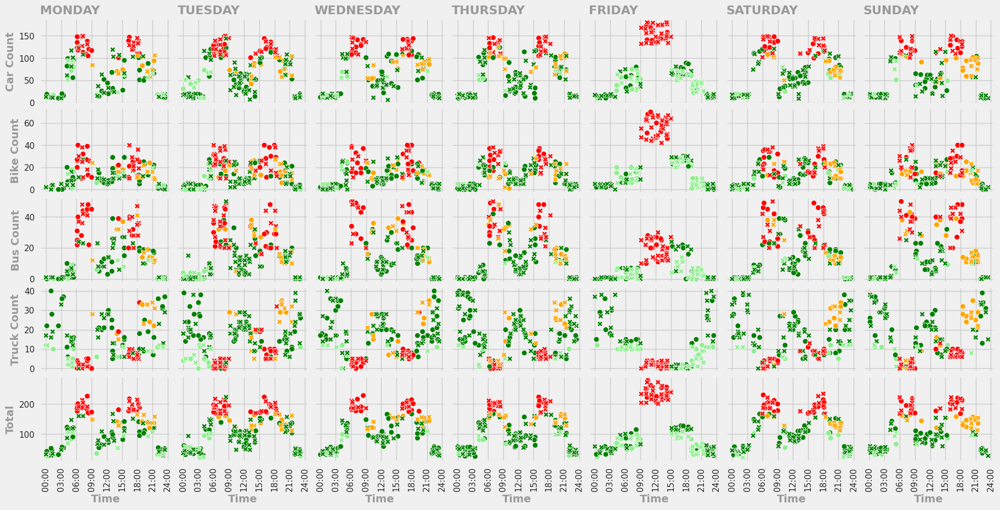

In [93]:
data_train_test_500 = data_train_test.groupby('Cohort', group_keys = False).apply(lambda x: x.sample(min(len(x), 500)))

fig, axes = plt.subplots(nrows = 5, ncols = 7, figsize = (20,10), sharey = 'row', sharex = True)

DAYS_ = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
VEHICLES_ = ['CarCount', 'BikeCount', 'BusCount', 'TruckCount']

for ax,day in zip(axes[0,:].flat, DAYS_): #,day,vehicle in zip(axes.flat, DAYS_, VEHICLES_):
  
    g = sns.scatterplot(x = 'Hourf', y = 'CarCount', 
                        hue = 'Traffic Situation', 
                        palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
                        style = 'Cohort',
                        s = 50, 
                        data = data_train_test_500.loc[(data_train_test_500['Day of the week'] == day), :], 
                        ax = ax, legend = None)

for ax,day in zip(axes[1,:].flat, DAYS_): 
    
    g = sns.scatterplot(x = 'Hourf', y = 'BikeCount', 
                        hue = 'Traffic Situation', 
                        palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
                        style = 'Cohort',
                        s = 50, 
                        data = data_train_test_500.loc[(data_train_test_500['Day of the week'] == day), :], 
                        ax = ax, legend = None)
    
for ax,day in zip(axes[2,:].flat, DAYS_): 

    g = sns.scatterplot(x = 'Hourf', y = 'BusCount', 
                        hue = 'Traffic Situation', 
                        palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
                        style = 'Cohort',
                        s = 50, 
                        data = data_train_test_500.loc[(data_train_test_500['Day of the week'] == day), :], 
                        ax = ax, legend = None)
    
for ax,day in zip(axes[3,:].flat, DAYS_): 

    g = sns.scatterplot(x = 'Hourf', y = 'TruckCount', 
                        hue = 'Traffic Situation', 
                        palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
                        style = 'Cohort',
                        s = 50, 
                        data = data_train_test_500.loc[(data_train_test_500['Day of the week'] == day), :], 
                        ax = ax, legend = None)
    
for ax,day in zip(axes[4,:].flat, DAYS_):

    g = sns.scatterplot(x = 'Hourf', y = 'Total', 
                        hue = 'Traffic Situation', 
                        palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
                        style = 'Cohort',
                        s = 50, 
                        data = data_train_test_500.loc[(data_train_test_500['Day of the week'] == day), :], 
                        ax = ax, legend = None)
    
    g.set_xticks([0, 3, 6,9,12,15,18,21,24]) # <--- set the ticks first
    g.set_xticklabels(['00:00', '03:00', '06:00', '09:00', '12:00', '15:00', '18:00', '21:00', '24:00'])
    ax.tick_params(axis = 'x', rotation = 90)
    # ax.xaxis.set_major_formatter(dates.DateFormatter("%H:%M"))
    # ax.tick_params(left = False, bottom = False)

for i, YLABELS_ in zip([0,1,2,3,4], ['Car Count', 'Bike Count', 'Bus Count', 'Truck Count', 'Total']):
    axes[i,0].set_ylabel(YLABELS_, fontsize = 14, color = '0.6', fontweight = 'extra bold')
    
for j, XLABELS_ in zip([0,1,2,3,4,5,6], ['Time']*7):
    axes[4,j].set_xlabel(XLABELS_, fontsize = 14, color = '0.6', fontweight = 'extra bold')
    
for i, TITLES_ in zip([0,1,2,3,4,5,6], DAYS_):
    axes[0,i].set_title(TITLES_.upper(), loc = 'left', color = '0.6', fontsize = 16, fontweight = 'extra bold')
    
fig.subplots_adjust(wspace = 0.05, hspace = 0.05)


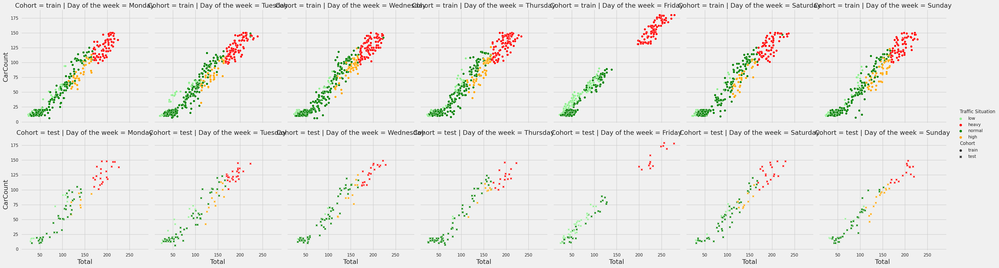

In [94]:
sns.relplot(
    data = data_train_test, 
    x="Total", y="CarCount",
    col = "Day of the week", col_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], 
    hue = "Traffic Situation", style = "Cohort",
    row = 'Cohort', row_order = ['train', 'test'],
    palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
    kind="scatter"
)

In [95]:
sns.set(font_scale = 1.2)

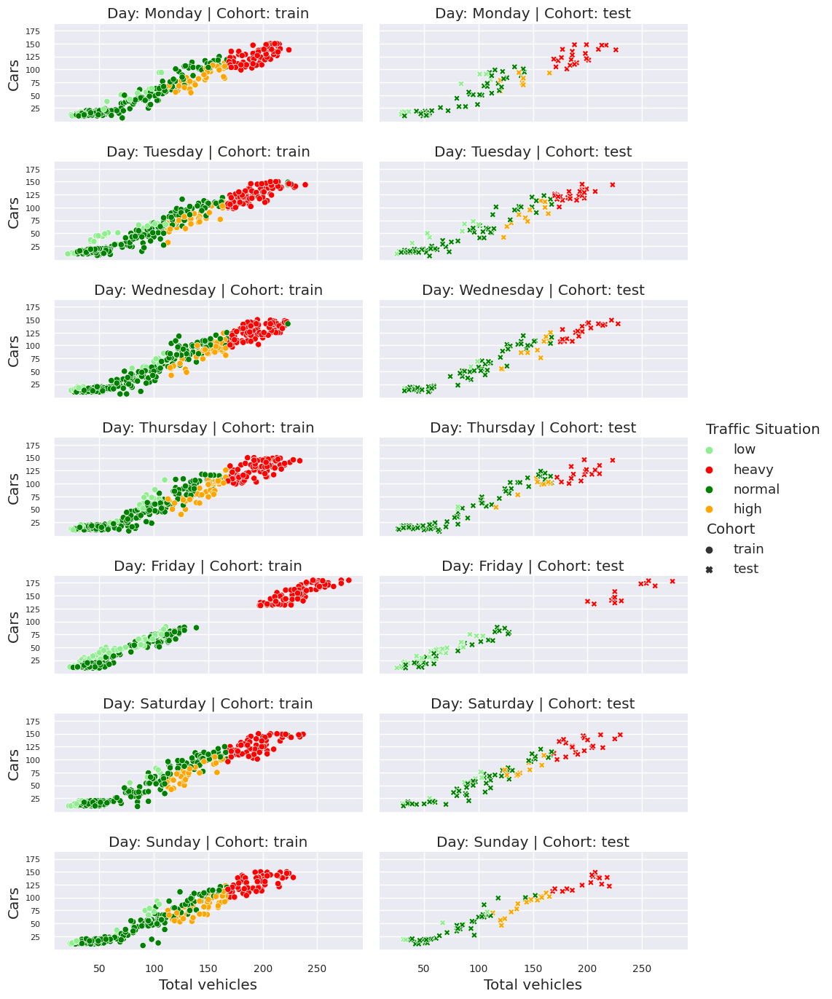

In [96]:
fig = \
sns.relplot(
    data = data_train_test, 
    x="Total", y="CarCount",
    row = "Day of the week", row_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], 
    hue = "Traffic Situation", style = "Cohort",
    col = 'Cohort', col_order = ['train', 'test'],
    palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
    kind = "scatter", aspect = 2.5, height = 2,
)\
    .set_titles("Day: {row_name} | Cohort: {col_name}")\
    .set_axis_labels("Total vehicles", "Cars")

for ax in fig.axes.flat:
    ax.set_yticks(ticks = [25,50,75,100,125,150,175]) # set new labels
    ax.set_yticklabels(fontsize = 8, rotation = 0, labels = [25,50,75,100,125,150,175])
    
    ax.set_xticks(ticks = [50,100,150,200,250])
    ax.set_xticklabels(fontsize = 10, rotation = 0, labels = [50,100,150,200,250])

fig.savefig('./figures/traffic-situation-train-test-by-carcount-day-and-hour.pdf', format = 'pdf', bbox_inches = 'tight')

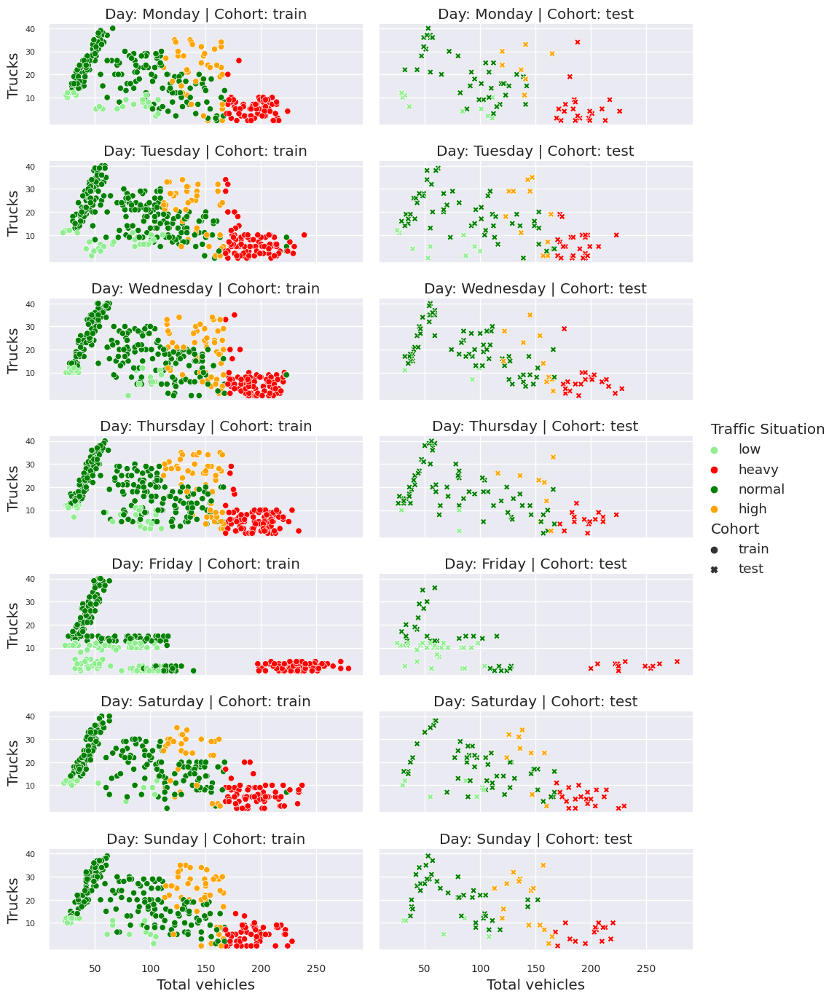

In [97]:
fig = \
sns.relplot(
    data = data_train_test, 
    x="Total", y="TruckCount",
    row = "Day of the week", row_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], 
    hue = "Traffic Situation", style = "Cohort",
    col = 'Cohort', col_order = ['train', 'test'],
    palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
    kind = "scatter", aspect = 2.5, height = 2,
)\
    .set_titles("Day: {row_name} | Cohort: {col_name}")\
    .set_axis_labels("Total vehicles", "Trucks")

for ax in fig.axes.flat:
    ax.set_yticks(ticks = [10,20,30,40]) # set new labels
    ax.set_yticklabels(fontsize = 8, rotation = 0, labels = [10,20,30,40])
    
    ax.set_xticks(ticks = [50,100,150,200,250])
    ax.set_xticklabels(fontsize = 10, rotation = 0, labels = [50,100,150,200,250])

fig.savefig('./figures/traffic-situation-train-test-by-truckcount-day-and-hour.pdf', format = 'pdf', bbox_inches = 'tight')

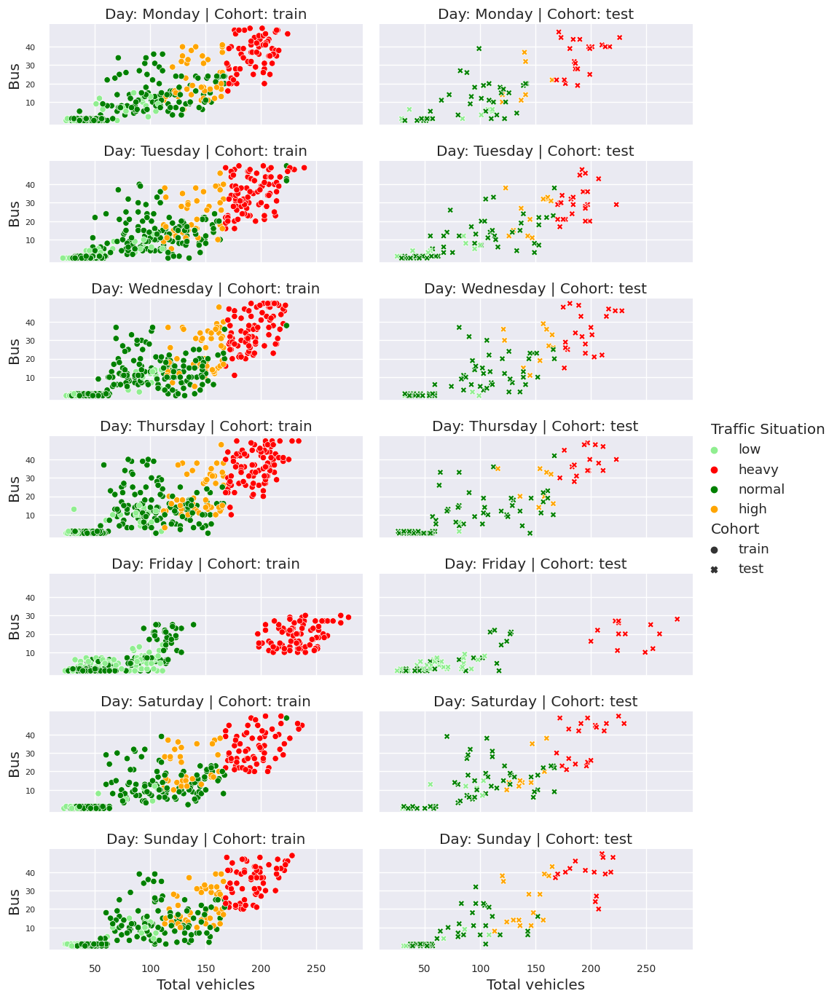

In [98]:
fig = \
sns.relplot(
    data = data_train_test, 
    x="Total", y="BusCount",
    row = "Day of the week", row_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], 
    hue = "Traffic Situation", style = "Cohort",
    col = 'Cohort', col_order = ['train', 'test'],
    palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
    kind = "scatter", aspect = 2.5, height = 2,
)\
    .set_titles("Day: {row_name} | Cohort: {col_name}")\
    .set_axis_labels("Total vehicles", "Bus")


for ax in fig.axes.flat:
    ax.set_yticks(ticks = [10,20,30,40]) # set new labels
    ax.set_yticklabels(fontsize = 8, rotation = 0, labels = [10,20,30,40])
    
    ax.set_xticks(ticks = [50,100,150,200,250])
    ax.set_xticklabels(fontsize = 10, rotation = 0, labels = [50,100,150,200,250])

fig.savefig('./figures/traffic-situation-train-test-by-buscount-day-and-hour.pdf', format = 'pdf', bbox_inches = 'tight')

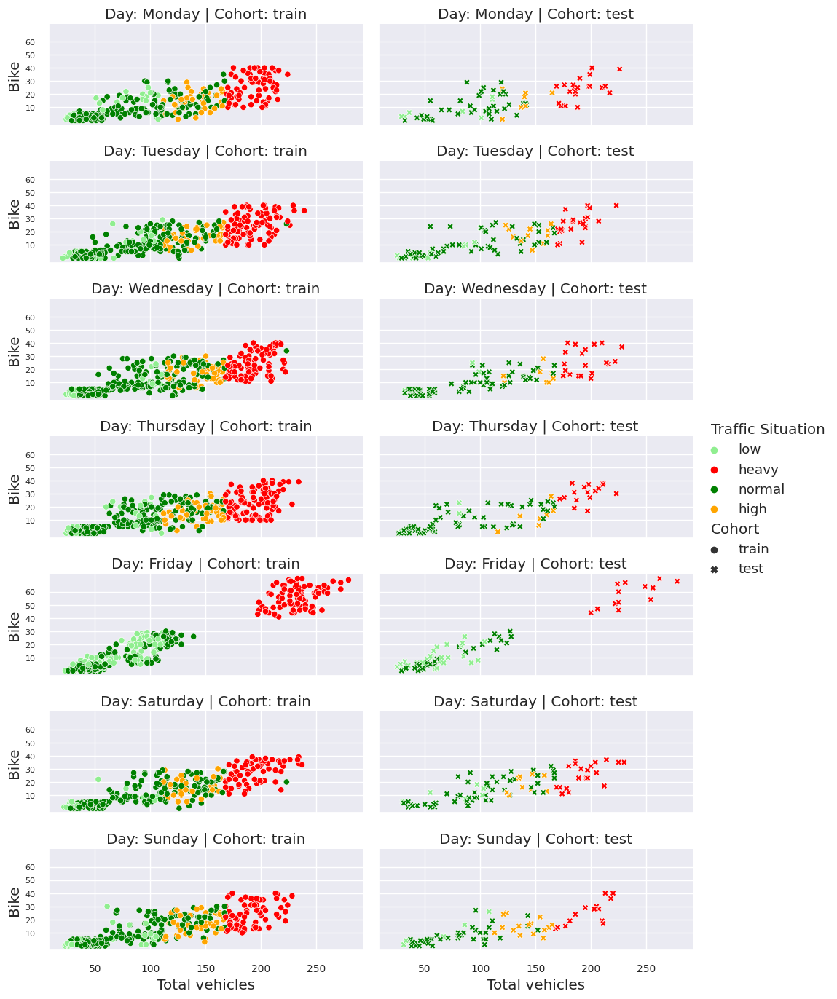

In [99]:
fig = \
sns.relplot(
    data = data_train_test, 
    x="Total", y="BikeCount",
    row = "Day of the week", row_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], 
    hue = "Traffic Situation", style = "Cohort",
    col = 'Cohort', col_order = ['train', 'test'],
    palette = {'normal': 'green', 'low': 'lightgreen', 'high': 'orange', 'heavy': 'red'},
    kind = "scatter", aspect = 2.5, height = 2,
)\
    .set_titles("Day: {row_name} | Cohort: {col_name}")\
    .set_axis_labels("Total vehicles", "Bike")


for ax in fig.axes.flat:
    ax.set_yticks(ticks = [10,20,30,40,50,60]) # set new labels
    ax.set_yticklabels(fontsize = 8, rotation = 0, labels = [10,20,30,40,50,60])
    
    ax.set_xticks(ticks = [50,100,150,200,250])
    ax.set_xticklabels(fontsize = 10, rotation = 0, labels = [50,100,150,200,250])

fig.savefig('./figures/traffic-situation-train-test-by-bikecount-day-and-hour.pdf', format = 'pdf', bbox_inches = 'tight')

# Comentarios finales

Para predecir la situación del tráfico de manera efectiva, es importante considerar una variedad de parámetros que puedan influir en el flujo de vehículos. Aquí hay algunos parámetros adicionales que podrían ser útiles para mejorar la precisión de un modelo de predicción de tráfico:

  1. **Horas del día**:
    El tráfico a menudo varía según la hora del día. Puedes considerar la hora exacta del registro y la franja horaria correspondiente para capturar patrones diarios.
   
  2. **Día de la semana**:
    Además de saber qué día de la semana es, también puede ser útil incluir información sobre si es festivo o no, ya que los patrones de tráfico pueden variar significativamente.

  1. **Condiciones meteorológicas**:
    La temperatura, la lluvia, la nieve, la niebla y otros factores climáticos pueden afectar significativamente el tráfico. Un modelo de predicción de tráfico debe tener en cuenta las condiciones meteorológicas actuales y futuras. Además, no es lo mismo conducir de noche que de día, por lo que no será lo mismo llegar al polígono industrial a las 8 de la mañana en verano que en invierno.

  2. **Eventos especiales**:
    La presencia de eventos especiales como conciertos, deportes, desfiles u otras actividades en la ciudad puede afectar el tráfico. Incluir información sobre eventos planificados en la zona puede ser valioso.

  3. **Datos de tráfico históricos**:
    Utilizar datos históricos de tráfico, como los patrones de tráfico en la misma fecha en años anteriores, puede proporcionar información adicional para hacer predicciones más precisas.

  4. **Condiciones de la carretera**:
    La calidad de la carretera, la presencia de obras viales o accidentes en curso pueden influir en el tráfico. Incorporar información sobre el estado de la carretera es importante.

  5. **Información sobre transporte público**:
    Considerar la disponibilidad y el estado de sistemas de transporte público, como trenes y autobuses, puede ayudar a comprender cómo afectan al tráfico en la zona.

  6. **Eventos inesperados**:
    Tener la capacidad de detectar eventos inesperados en tiempo real, como accidentes, cierres de carreteras o circulación de vehículos especiales, puede ser crucial para adaptar las predicciones de tráfico.

Medidas que se podrían tomar en función de las predicciones del tráfico incluyen:

  1. **Gestión del tráfico**: Se pueden ajustar los semáforos y señales de tráfico para gestionar el flujo de vehículos en tiempo real, de acuerdo con las predicciones.

  2. **Información al público**: Proporcionar a los conductores información en tiempo real sobre el estado del tráfico y rutas alternativas a través de aplicaciones móviles o señales electrónicas.

  3. **Planificación de rutas**: Las empresas de entrega y logística pueden utilizar las predicciones de tráfico para planificar rutas más eficientes u horarios adaptados y evitar retrasos.

  4. **Control de eventos**: Organizadores de eventos pueden tomar medidas para gestionar el tráfico cuando se esperan multitudes, como proporcionar transporte público adicional o estacionamientos alternativos.

En resumen, la predicción de la situación del tráfico puede beneficiarse de una amplia gama de datos, incluyendo condiciones meteorológicas, eventos especiales y más. Además, las medidas que se toman en función de estas predicciones pueden ayudar a mejorar la eficiencia y la seguridad del tráfico en una región determinada.

In [101]:
print(convert_model(tuned_gbc, language = 'r'))

ValueError: Wrong language pyhton. Expected one of 'python', 'java', 'c', 'c#', 'dart', 'f#', 'go', 'haskell', 'javascript', 'php', 'powershell', 'r', 'ruby', 'vb'.

In [103]:
create_api(tuned_gbc, api_name = 'my_first_api')

API successfully created. This function only creates a POST API, it doesn't run it automatically. To run your API, please run this command --> !python my_first_api.py


In [104]:
create_app(tuned_gbc)

Running on local URL:  http://127.0.0.1:7860

To create a public link, set `share=True` in `launch()`.
